# Import

In [1]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import os
import pathlib
import seaborn as sns
from PIL import Image
import nltk
from nltk.corpus import stopwords
from nltk.util import ngrams
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize
from collections import defaultdict,Counter
from sklearn.feature_extraction.text import CountVectorizer
import gensim
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from textblob import TextBlob
from textstat import flesch_reading_ease
from sklearn.metrics import r2_score
import circlify

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('vader_lexicon')

sns.set_theme()


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Denis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Denis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Denis\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Denis\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Denis\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


# Caricamento dati

In [2]:
dataf = pd.read_csv("../Dati/multidimensional.csv")
dataf

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unit_id,tries_amount,questionnaire_amount,dimensions_amount,document_amount,current_try,q_0_age_question,q_0_age_answer,q_0_age_value,q_0_school_question,...,doc_speaker's-trustworthiness_value,doc_speaker's-trustworthiness_label,doc_speaker's-trustworthiness_justification,doc_speaker's-trustworthiness_url,doc_informativeness_value,doc_informativeness_label,doc_informativeness_justification,doc_informativeness_url,doc_accesses,doc_time_elapsed
0,unit_1,10,4,9,11,1,What is your age range?,26-35,2.0,What is the highest level of school you have c...,...,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,agree,NaN,NaN,1.0,175.61
1,unit_1,10,4,9,11,1,What is your age range?,26-35,2.0,What is the highest level of school you have c...,...,2.0,completely-agree,NaN,NaN,2.0,completely-agree,NaN,NaN,1.0,88.39
2,unit_1,10,4,9,11,1,What is your age range?,26-35,2.0,What is the highest level of school you have c...,...,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,agree,NaN,NaN,1.0,84.60
3,unit_1,10,4,9,11,1,What is your age range?,26-35,2.0,What is the highest level of school you have c...,...,2.0,completely-agree,NaN,NaN,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,53.41
4,unit_1,10,4,9,11,1,What is your age range?,26-35,2.0,What is the highest level of school you have c...,...,0.0,neither-agree-nor-disagree,NaN,NaN,2.0,completely-agree,NaN,NaN,1.0,361.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,unit_156,10,4,9,11,1,What is your age range?,36-50,3.0,What is the highest level of school you have c...,...,0.0,neither-agree-nor-disagree,NaN,NaN,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,74.91
2196,unit_156,10,4,9,11,1,What is your age range?,36-50,3.0,What is the highest level of school you have c...,...,1.0,agree,NaN,NaN,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,53.62
2197,unit_156,10,4,9,11,1,What is your age range?,36-50,3.0,What is the highest level of school you have c...,...,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,agree,NaN,NaN,1.0,115.88
2198,unit_156,10,4,9,11,1,What is your age range?,36-50,3.0,What is the highest level of school you have c...,...,0.0,neither-agree-nor-disagree,NaN,NaN,1.0,agree,NaN,NaN,1.0,72.78


## ---------------------------

# Analisi

In [2]:
#numero di statement da selezionare per file delle analisi
n_stat=10

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

## Elimina colonne che non servono all'analisi

In [4]:
print([col for col in dataf])

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['unit_id', 'tries_amount', 'questionnaire_amount', 'dimensions_amount', 'document_amount', 'current_try', 'q_0_age_question', 'q_0_age_answer', 'q_0_age_value', 'q_0_school_question', 'q_0_school_answer', 'q_0_school_value', 'q_0_taxes_question', 'q_0_taxes_answer', 'q_0_taxes_value', 'q_0_political_views_question', 'q_0_political_views_answer', 'q_0_political_views_value', 'q_0_consideration_question', 'q_0_consideration_answer', 'q_0_consideration_value', 'q_0_southern_border_question', 'q_0_southern_border_answer', 'q_0_southern_border_value', 'q_0_environment_question', 'q_0_environment_answer', 'q_0_environment_value', 'q_0_time_elapsed', 'q_0_accesses', 'q_1_farmers_question', 'q_1_farmers_answer', 'q_1_farmers_value', 'q_1_time_elapsed', 'q_1_accesses', 'q_2_marks_question', 'q_2_marks_answer', 'q_2_marks_value', 'q_2_time_elapsed', 'q_2_accesses', 'q_3_athletics_question', 'q_3_athletics_answer', 'q_3_athletics_value', 'q_3_time_elapsed', 'q_3_accesses', 'doc_index', 'doc_name

In [3]:
def shorten_school(x):
    if x.startswith('F'):
        return '4 year college/bachelor degree'
    elif x.startswith('H'):
        return 'High school graduate or GED (etc.)'
    elif x.startswith('P'):
        return 'Postgrad. or professional degree (etc.)'
    elif x.startswith('Some c'):
        return 'Some college (etc.)'
    elif x.startswith('Some p'):
        return 'Postgrad. or professional schooling, no degree'

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [5]:
data=dataf[[col for col in dataf if 
            col=='unit_id' or
            col=='current_try' or
            (col.startswith('q_0') and col.endswith('answer')) or
            (col.startswith(('q_1','q_2','q_3')) and col.endswith(('question','value'))) or
            col.endswith('elapsed') or
            (col.startswith('doc_') and (col.endswith(('politifact_label','abc_label','accesses','doc_overall-truthfulness_url')) or not col.endswith(('label','justification','url'))))
             ]]
data=data.loc[data['doc_name']!='DEM_BARELYTRUE_doc7']

data['q_1_farmers_value']=data['q_1_farmers_value'].map(lambda x: 'correct value' if x==3 else 'wrong value')
data['q_2_marks_value']=data['q_2_marks_value'].map(lambda x: 'correct value' if x==9 else 'wrong value')
data['q_3_athletics_value']=data['q_3_athletics_value'].map(lambda x: 'correct value' if x==4 else 'wrong value')
    
data['q_0_school_answer']=data['q_0_school_answer'].map(shorten_school)
data

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unit_id,current_try,q_0_age_answer,q_0_school_answer,q_0_taxes_answer,q_0_political_views_answer,q_0_consideration_answer,q_0_southern_border_answer,q_0_environment_answer,q_0_time_elapsed,...,doc_confidence_value,doc_correctness_value,doc_neutrality_value,doc_comprehensibility_value,doc_precision_value,doc_completeness_value,doc_speaker's-trustworthiness_value,doc_informativeness_value,doc_accesses,doc_time_elapsed
0,unit_1,1,26-35,Some college (etc.),"30,000 to less than 40,000",Very liberal,Independent,Disagree,Agree,38.60,...,-1.0,1.0,1.0,1.0,1.0,-1.0,0.0,1.0,1.0,175.61
1,unit_1,1,26-35,Some college (etc.),"30,000 to less than 40,000",Very liberal,Independent,Disagree,Agree,38.60,...,0.0,2.0,-1.0,2.0,2.0,2.0,2.0,2.0,1.0,88.39
2,unit_1,1,26-35,Some college (etc.),"30,000 to less than 40,000",Very liberal,Independent,Disagree,Agree,38.60,...,0.0,0.0,-1.0,2.0,2.0,-1.0,0.0,1.0,1.0,84.60
3,unit_1,1,26-35,Some college (etc.),"30,000 to less than 40,000",Very liberal,Independent,Disagree,Agree,38.60,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,53.41
4,unit_1,1,26-35,Some college (etc.),"30,000 to less than 40,000",Very liberal,Independent,Disagree,Agree,38.60,...,-1.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,1.0,361.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,unit_156,1,36-50,4 year college/bachelor degree,"75,000 to less than 100,000",Moderate,Democrat,No opinion either way,Agree,371.26,...,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,74.91
2196,unit_156,1,36-50,4 year college/bachelor degree,"75,000 to less than 100,000",Moderate,Democrat,No opinion either way,Agree,371.26,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,53.62
2197,unit_156,1,36-50,4 year college/bachelor degree,"75,000 to less than 100,000",Moderate,Democrat,No opinion either way,Agree,371.26,...,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,115.88
2198,unit_156,1,36-50,4 year college/bachelor degree,"75,000 to less than 100,000",Moderate,Democrat,No opinion either way,Agree,371.26,...,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,72.78


## ---------------------------

In [6]:
def create_rows_file(data, wrong_correct, false_true, false_true_labels, source, mean_col, n_stat, col_list):
#false_true_labels: lista con 1 elemento se source != 'all', altrimenti 2 elementi ['label_abc', 'label_politifact']
    source=source.lower()
    if(source=='all'):
        data_rows=data.loc[(data['doc_ground_truth_abc_label']==false_true_labels[0]) | (data['doc_ground_truth_politifact_label']==false_true_labels[1])]
    else:
        n_stat=int(n_stat/2)
        data_rows=data.loc[data[f"doc_ground_truth_{source}_label"]==false_true_labels[0]]
    

    r=data_rows.copy()
    length=len(r)
    
    df=pd.DataFrame(columns=['type','value','rate'])
    for col in col_list:
        if(col=='doc_overall-truthfulness_url'):
            r['doc_overall-truthfulness_url']=r['doc_overall-truthfulness_url'].map(lambda x: x.split("/")[2])
        if(col=='doc_name'):
            r['doc_name']=r['doc_name'].map(lambda x: x.split('_')[0])
            
        d=r.groupby(col,as_index = False).size().rename(columns={'size':'rate', col:'value'})
        d['rate']/=length
    
        d.insert(loc=0, column='type', value=col)
        df=pd.concat([df, d])
            
    pathlib.Path(f"../Dati/ratio_data").mkdir(parents=True, exist_ok=True) 
    df.to_csv(f"../Dati/ratio_data/ratio_{false_true}_{source}_{n_stat}.csv", index=False)
    
    statements_rows=data_rows.groupby('doc_name',as_index = False)[mean_col].mean().sort_values(by=mean_col)
    if((wrong_correct=='wrong' and false_true=='false') or (wrong_correct=='correct' and false_true=='true')):
        statements_rows=statements_rows.tail(n_stat)['doc_name'].values
    else:
        statements_rows=statements_rows.head(n_stat)['doc_name'].values

    rows=data_rows.loc[data_rows['doc_name'].isin(statements_rows)]
    pathlib.Path(f"../Dati/rows").mkdir(parents=True, exist_ok=True) 
    rows.to_csv(f"../Dati/rows/{wrong_correct}_{false_true}_{source}_{n_stat}.csv", index=False)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [4]:
columns=['current_try' ,'q_0_age_answer', 'q_0_school_answer', 'q_0_taxes_answer',
 'q_0_political_views_answer' ,'q_0_consideration_answer',
 'q_0_southern_border_answer', 'q_0_environment_answer', 'q_1_farmers_value',
 'q_2_marks_value' ,'q_3_athletics_value' ,'doc_index', 'doc_name',
 'doc_claimant', 'doc_date' ,'doc_source' ,'doc_overall-truthfulness_value',
 'doc_confidence_value', 'doc_correctness_value' ,'doc_neutrality_value',
 'doc_comprehensibility_value' ,'doc_precision_value',
 'doc_completeness_value' ,"doc_speaker's-trustworthiness_value",
 'doc_informativeness_value', 'doc_accesses','doc_overall-truthfulness_url']

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## Wrong

### Wrong all

#### Wrong all false

Selezione wrong con ground truth = negative per statement *ABC* e ground truth = pants-on-fire per statement *POLITIFACT*

In [8]:
create_rows_file(data,'wrong','false',['negative', 'pants-on-fire'],'all','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Wrong all true

Selezione wrong con ground truth = positive per statement *ABC* e ground truth = true per statement *POLITIFACT*

In [9]:
create_rows_file(data,'wrong','true',['positive', 'true'],'all','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Wrong POLITIFACT

#### Wrong POLITIFACT false

Selezione wrong con ground truth = pants-on-fire per statement *POLITIFACT*

In [10]:
create_rows_file(data,'wrong','false',['pants-on-fire'],'POLITIFACT','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Wrong POLITIFACT true

Selezione wrong con ground truth = true per statement *POLITIFACT*

In [11]:
create_rows_file(data,'wrong','true',['true'],'POLITIFACT','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Wrong ABC

#### Wrong ABC false

Selezione wrong con ground truth = negative per statement *ABC*

In [12]:
create_rows_file(data,'wrong','false',['negative'],'ABC','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Wrong ABC true

Selezione wrong con ground truth = positive per statement *ABC*

In [13]:
create_rows_file(data,'wrong','true',['positive'],'ABC','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

## Correct

### Correct all

#### Correct all false

Selezione correct con ground truth = negative per statement *ABC* e ground truth = pants-on-fire per statement *POLITIFACT*

In [14]:
create_rows_file(data,'correct','false',['negative','pants-on-fire'],'all','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Correct all true

Selezione correct con ground truth = positive per statement *ABC* e ground truth = true per statement *POLITIFACT*

In [15]:
create_rows_file(data,'correct','true',['positive','true'],'all','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Correct POLITIFACT

#### Correct POLITIFACT false

Selezione correct con ground truth = pants-on-fire per statement *POLITIFACT*

In [16]:
create_rows_file(data,'correct','false',['pants-on-fire'],'POLITIFACT','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Correct POLITIFACT true

Selezione correct con ground truth = true per statement *POLITIFACT*

In [17]:
create_rows_file(data,'correct','true',['true'],'POLITIFACT','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Correct ABC

#### Correct ABC false

Selezione correct con ground truth = negative per statement *ABC*

In [18]:
create_rows_file(data,'correct','false',['negative'],'ABC','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Correct ABC true

Selezione correct con ground truth = positive per statement *ABC*

In [19]:
create_rows_file(data,'correct','true',['positive'],'ABC','doc_overall-truthfulness_value',n_stat, columns)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## File unici

In [20]:
filenames_rows = next(os.walk("../Dati/rows"), (None, None, []))[2]
df=pd.DataFrame()

for f in filenames_rows:
    r=pd.read_csv(f"../Dati/rows/{f}")
    r.insert(0, 'type', f.split(".")[0])
    df=pd.concat([df,r])
    df.to_csv(f"../Dati/all_rows.csv",index=False)
    os.remove(f"../Dati/rows/{f}")
os.rmdir(f"../Dati/rows") 

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [21]:
filenames_ratio = next(os.walk("../Dati/ratio_data"), (None, None, []))[2]
df=pd.DataFrame()

for f in filenames_ratio:
    r=pd.read_csv(f"../Dati/ratio_data/{f}")
    r.insert(0, 'file', f.split(".")[0][6:])
    df=pd.concat([df,r])
    df.to_csv(f"../Dati/all_ratio.csv",index=False)
    os.remove(f"../Dati/ratio_data/{f}")
os.rmdir(f"../Dati/ratio_data") 

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

## Analisi groupby

In [22]:
df_col=pd.DataFrame()
d=pd.read_csv(f"../Dati/all_rows.csv")
d['doc_overall-truthfulness_url']=d['doc_overall-truthfulness_url'].map(lambda x: x.split("/")[2])

for col in columns+['unit_id']:  
    for fname in d.type.unique():
        if(col=='doc_name'):
            count=pd.DataFrame({'value': [x.split('_')[0] for x in d[d['type']==fname]['doc_name'].values]}).groupby('value',as_index = False).size().rename(columns={'size':'rate'})
        else:
            count=d[d['type']==fname].groupby(col,as_index = False).size().rename(columns={'size':'rate', col:'value'})
        if('all' in fname):
            count['rate']/=10*n_stat
        else:
            count['rate']/=10*n_stat/2
        count.insert(0, 'type', col)
        count.insert(0, 'file', fname)
        df_col=pd.concat([df_col, count])
        
df_col.to_csv(f"../Dati/groupby.csv",index=False)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

## Creazione grafici groupby

In [5]:
def create_collage(width, height, cols, rows, listofimages, savename):
    thumbnail_width = width//cols
    thumbnail_height = height//rows
    size = thumbnail_width, thumbnail_height
    new_im = Image.new('RGB', (width, height))
    ims = []
    for p in listofimages:
        im = Image.open(p)
        im.thumbnail(size)
        ims.append(im)
    i = 0
    x = 0
    y = 0
    for col in range(cols):
        for row in range(rows):
            print(i, x, y)
            new_im.paste(ims[i], (x, y))
            i += 1
            y += thumbnail_height+2
        x += thumbnail_width+2
        y = 0

    new_im.save(savename)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [24]:
def circle_graph(data,savename):
  circles = circlify.circlify(
      data, 
      show_enclosure=False, 
      target_enclosure=circlify.Circle(x=0, y=0, r=1)
  )

  co=sns.color_palette('tab10',len(types))
  colors={}
  for t,c in zip(types, co):
    colors[t]=c
    
  fig, ax = plt.subplots(figsize=(100,100))

  # Remove axes
  ax.axis('off')

  # Find axis boundaries
  lim = max(
      max(
          abs(circle.x) + circle.r,
          abs(circle.y) + circle.r,
      )
      for circle in circles
  )
  plt.xlim(-lim, lim)
  plt.ylim(-lim, lim)

  #correct_worng level
  for circle in circles:
      if circle.level == 2:
        x, y, r = circle
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#37cced" if(circle.ex["id"]=='correct') else '#f7a334' ))


  for circle in circles:
      if circle.level == 2:
        x, y, r = circle
        label = f"{circle.ex['id']}\n({circle.ex['datum']:.2f})"
        plt.annotate(label, (x,y-r) , fontsize=50, ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5))
      
  #true_false level
  for circle in circles:
      if circle.level == 3:
        x, y, r = circle
        label = f"{circle.ex['id']}\n({circle.ex['datum']:.2f})"
        ax.add_patch( plt.Circle((x, y), r,  linewidth=2, color='#eb604d' if(circle.ex["id"]=='false') else '#72db8e'))
        plt.annotate(label, (x,y-r),   fontsize=50, ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5))

  #type level
  for circle in circles:
      if circle.level == 4:
        x, y, r = circle
        label = f"{circle.ex['id']}\n({circle.ex['datum']:.2f})"
        ax.add_patch( plt.Circle((x, y), r,  linewidth=2, color=colors[circle.ex["id"]]))
        plt.annotate(label, (x,y-r),  fontsize=15,ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5))
      
  #value level
  for circle in circles:
      if circle.level == 5:
        x, y, r = circle
        label = f"{circle.ex['id']}\n({circle.ex['datum']:.2f})"
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="yellow"))
        plt.annotate(label, (x,y ), ha='center', color="black")

  fig.tight_layout()
  fig.savefig(savename, bbox_inches='tight')


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [25]:
def create_data_circles(groupby, types):
    child_c_w=[]
    for c_w in groupby['c_w'].unique():
        child_f_t=[]
        
        for f_t in groupby.loc[groupby.c_w==c_w,'f_t'].unique():
            child_type=[]
            
            for typ in types:
                child_value=[]
                
                for value in groupby.loc[(groupby.c_w==c_w) & (groupby.f_t==f_t) & (groupby.type==typ),'value'].values:
                    child_value.append({'id': value, 'datum': groupby.loc[(groupby.c_w==c_w) & (groupby.f_t==f_t) & (groupby.type==typ) & (groupby.value==value), 'rate'].sum()})
                
                child_type.append({'id': typ, 'datum': groupby.loc[(groupby.c_w==c_w) & (groupby.f_t==f_t) & (groupby.type==typ), 'rate'].sum(), 'children':child_value})
            
            child_f_t.append({'id': f_t, 'datum': groupby.loc[(groupby.c_w==c_w) & (groupby.f_t==f_t), 'rate'].sum(), 'children':child_type})
            
        child_c_w.append({'id': c_w, 'datum': groupby.loc[groupby.c_w==c_w, 'rate'].sum(), 'children':child_f_t})

    return [{'id':'Total', 'datum': groupby['rate'].sum(), 'children':child_c_w}]


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
E:\Python\Python39\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


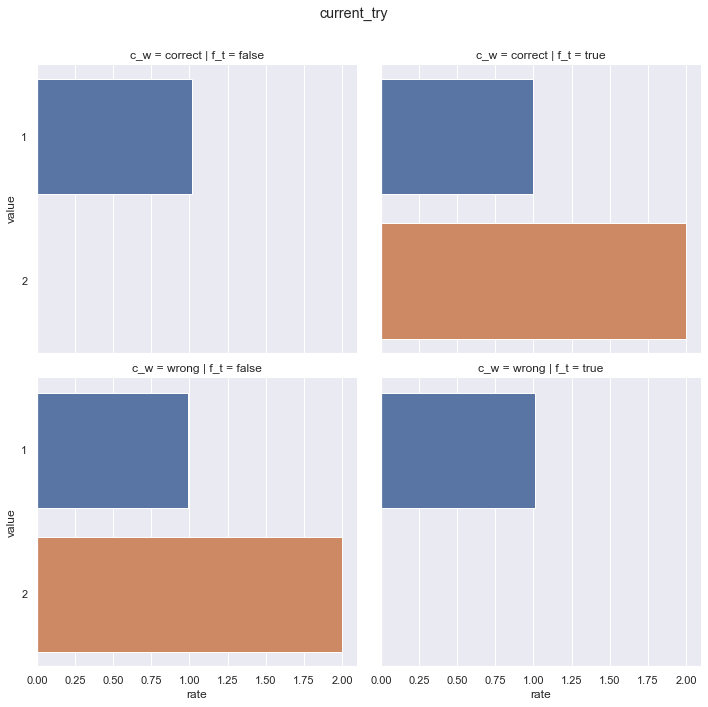

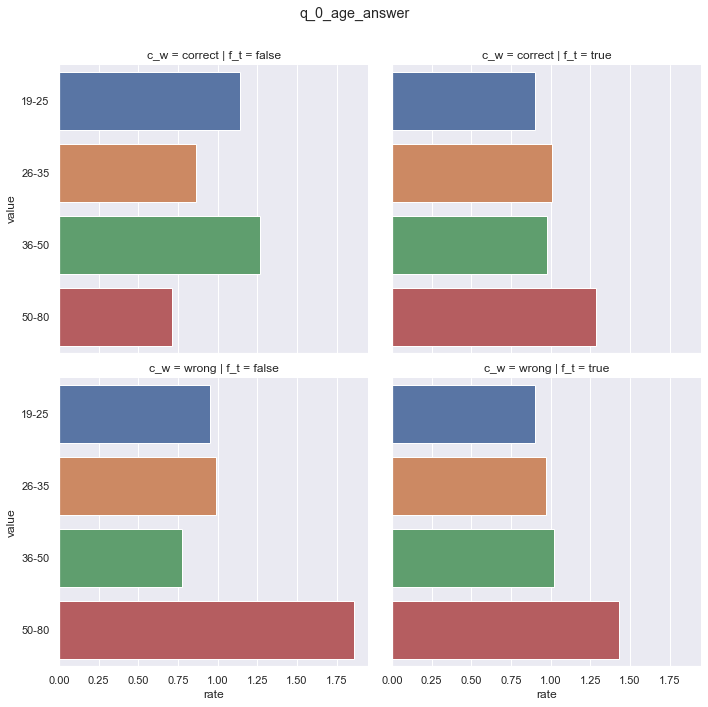

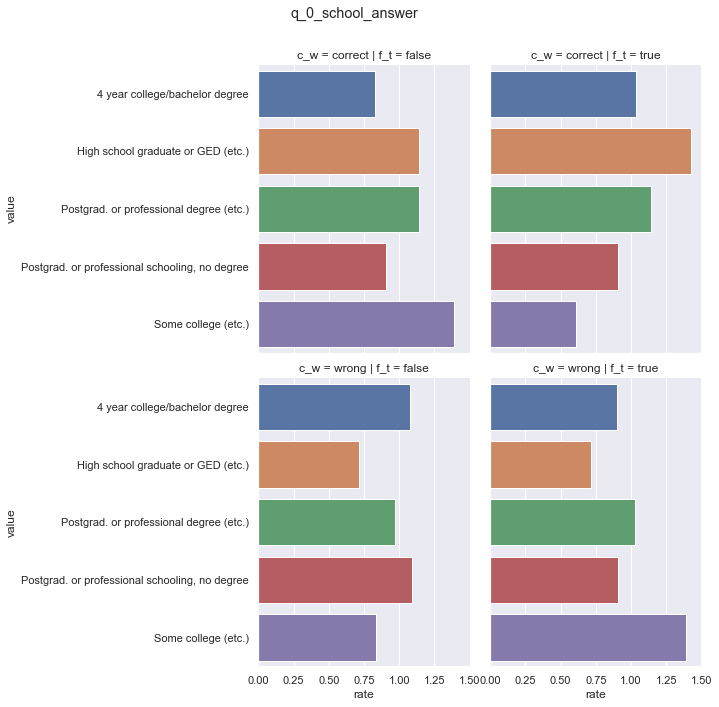

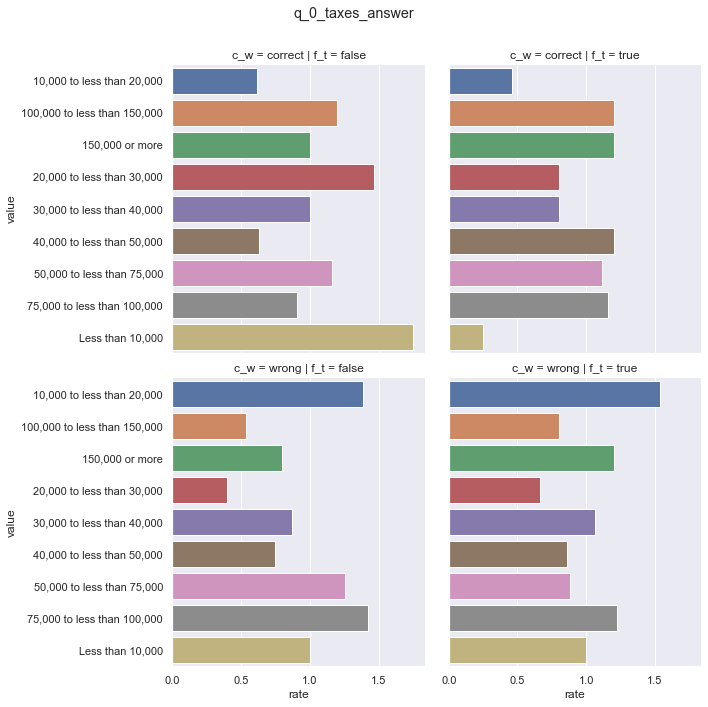

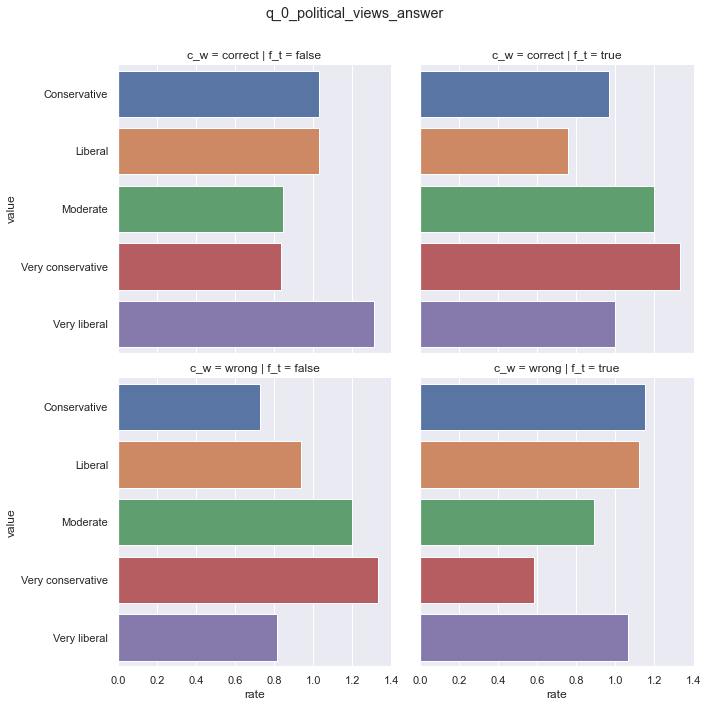

...

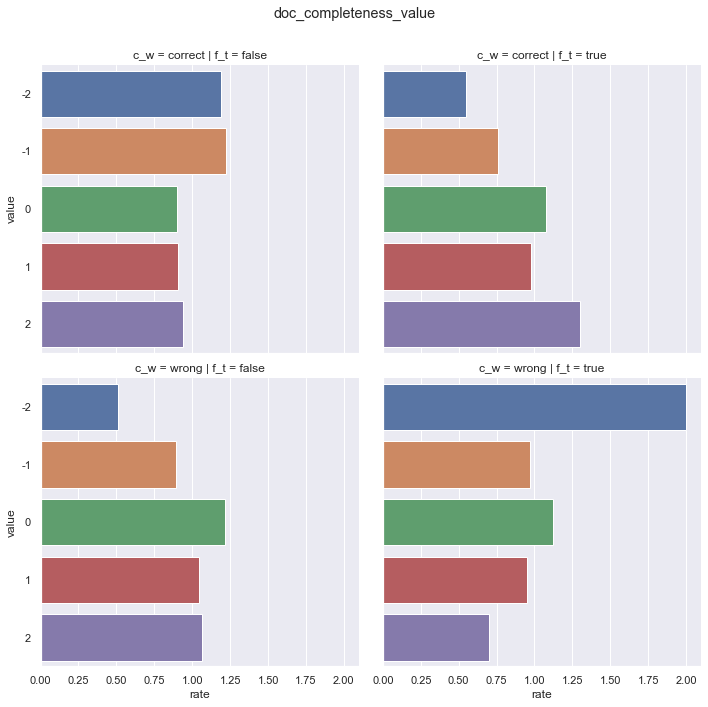

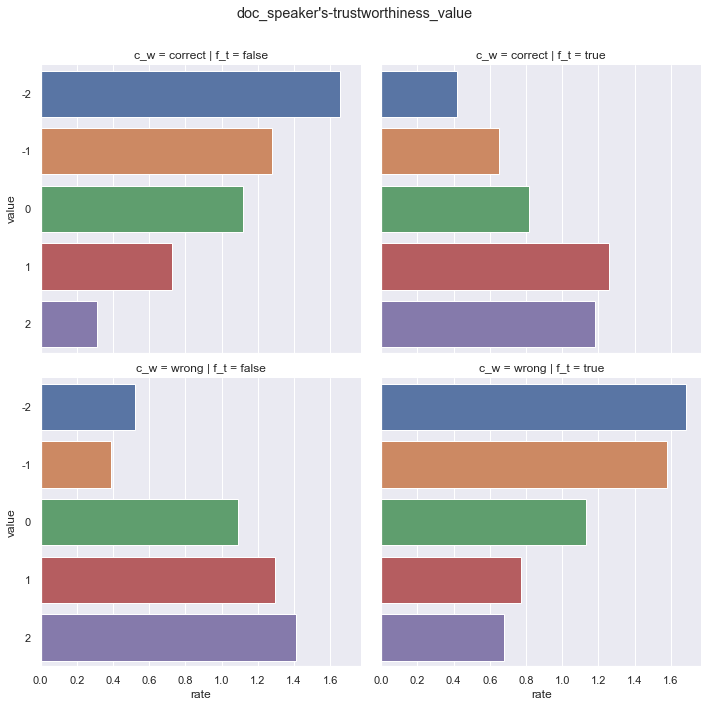

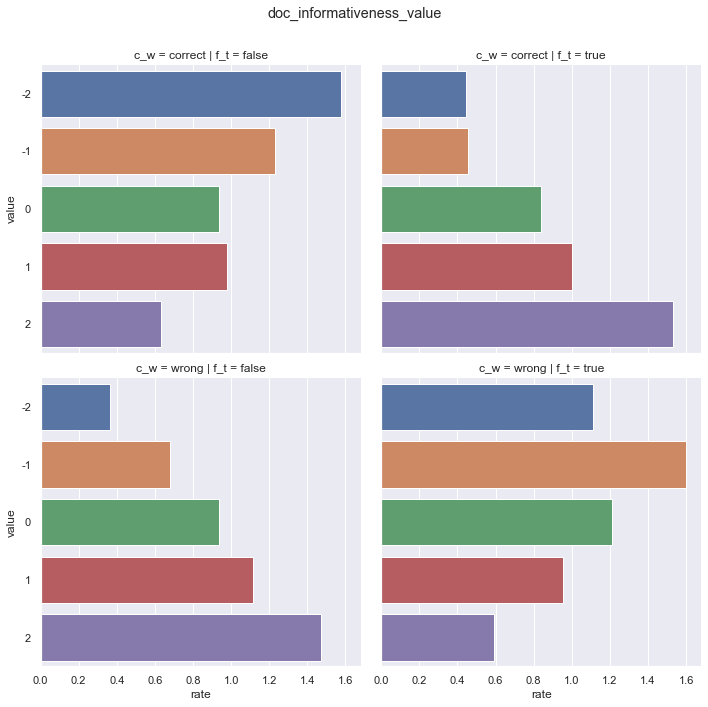

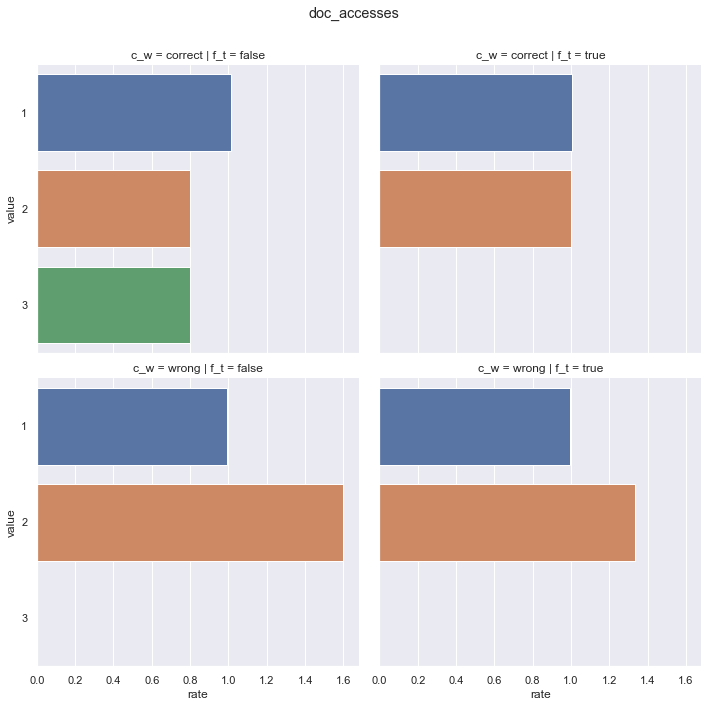

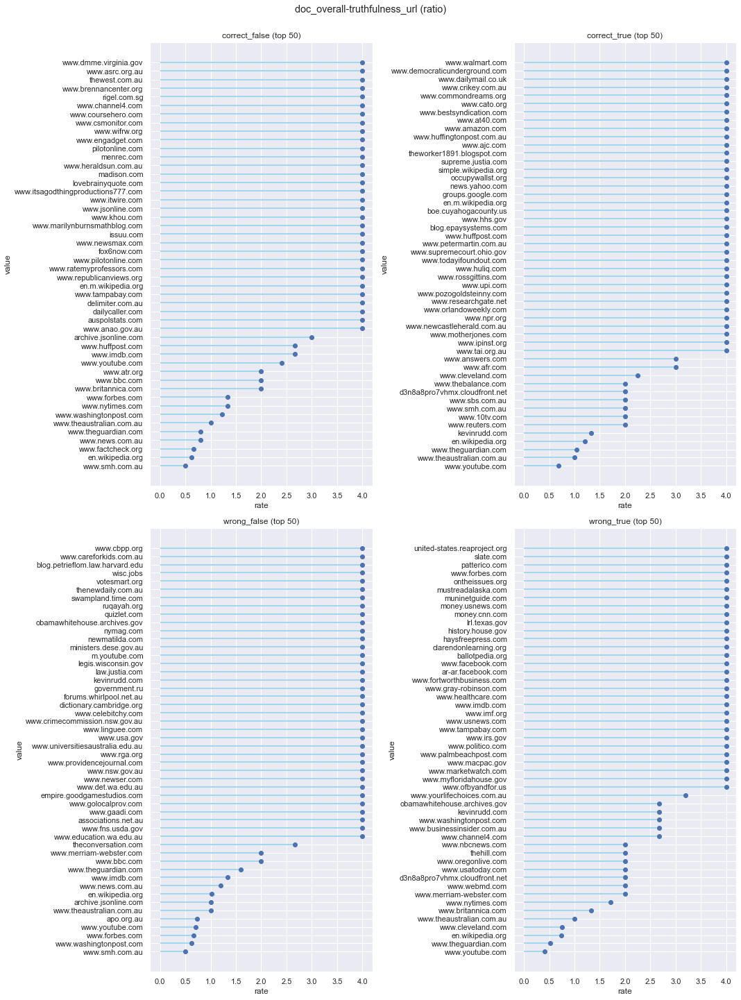

In [26]:
groupby=pd.read_csv("../Dati/groupby.csv")

suffix='_all_10'

groupby=groupby[groupby['file'].apply(lambda x: x.endswith(suffix))]
groupby['value']=groupby['value'].apply(lambda x: x[:-2] if x.endswith('.0') else x)

types=groupby.loc[~groupby.type.isin(['unit_id']), 'type'].unique()

files=groupby.loc[:,'file'].unique()

for col in columns:
    ratio=pd.read_csv(f"../Dati/all_ratio.csv")
    ratio=ratio[ratio['file'].apply(lambda x: x.endswith(suffix))]
    ratio['value']=ratio['value'].apply(lambda x: x[:-2] if x.endswith('.0') else x)
    # ratio[col]=ratio[col].astype('int64', errors='ignore')
    ratio.value=ratio.value.astype(str)

    def sum_ratio(x):
        x.rate=  x.rate / ratio.loc[(ratio.file=='_'.join(x.file.split('_')[1:])) & (ratio.type==x.type) & (ratio.value==x.value) , 'rate'].values[0] if x.value in ratio.loc[(ratio.file=='_'.join(x.file.split('_')[1:])) & (ratio.type==x.type),'value'].values  else 0
        return x
    
    for f in files:
        mask=((groupby.file==f) & (groupby.type==col))
        groupby.loc[mask]=groupby.loc[mask].apply(sum_ratio, axis=1)

groupby=groupby.loc[groupby.rate>0]

groupby['c_w']=groupby['file'].apply(lambda x: x.split('_')[0])
groupby['f_t']=groupby['file'].apply(lambda x: x.split('_')[1])

pathlib.Path(f"../Dati/pics").mkdir(parents=True, exist_ok=True) 
circle_graph(create_data_circles(groupby[groupby.type!='doc_overall-truthfulness_url'], types[~np.isin(types, 'doc_overall-truthfulness_url')]), f"../Dati/pics/groupby_circles.png")

for i,t in enumerate(types):
    if(t=='doc_overall-truthfulness_url'):
        amount=50
        fig, axs = plt.subplots(2,2,figsize=(15,20))
        for f, ax in zip(files,axs.flatten()): 
            urls=groupby[(groupby.type=='doc_overall-truthfulness_url') & (groupby.file == f)].sort_values('rate').head(amount)
            ax.hlines(y=urls['value'], xmin=0, xmax=urls['rate'], color='skyblue')
            ax.plot(urls['rate'], urls['value'], "o")
            ax.set_title('_'.join(f.split('_')[:-2])+f" (top {amount})")
            ax.set_xlabel('rate')
            ax.set_ylabel('value')
            
        fig.suptitle(t+' (ratio)', y=1)
        fig.tight_layout()
        pathlib.Path(f"../Dati/urls_analysis").mkdir(parents=True, exist_ok=True) 
        fig.savefig('../Dati/urls_analysis/urls_rate_ratio.png',  bbox_inches='tight')
    else:
        grid=sns.catplot(x="rate", y='value', row="c_w",
                    col='f_t', data=groupby[groupby.type==t],kind ='bar')
        # if(t.startswith('doc_') and t.endswith('_value')):
        #     for f,ax in zip(files,grid.axes.flatten()):
        #         k=groupby.loc[(groupby.file==f) & (groupby.type==t),['value', 'rate']]
        #         mean_line=sum(k.value.astype('int64')*k.rate)+2
        #         ax.axhline(mean_line, ls='--', c='black', label=f"mean = {mean_line:.2f}")
        #         ax.legend(loc='lower right')
                
        grid.figure.subplots_adjust(top=0.9)
        grid.figure.suptitle(t)
        
        pathlib.Path(f"../Dati/groupby_plots").mkdir(parents=True, exist_ok=True) 
        plt.savefig(f"../Dati/groupby_plots/{t}.png")


In [32]:
create_collage(6500, 1000, 13,2, [f"../Dati/groupby_plots/{t}.png" for t in  types[~np.isin(types, 'doc_overall-truthfulness_url')]], '../Dati/pics/groupby_collage.png')

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0 0 0
1 0 502
2 502 0
3 502 502
4 1004 0
5 1004 502
6 1506 0
7 1506 502
8 2008 0
9 2008 502
10 2510 0
11 2510 502
12 3012 0
13 3012 502
14 3514 0
15 3514 502
16 4016 0
17 4016 502
18 4518 0
19 4518 502
20 5020 0
21 5020 502
22 5522 0
23 5522 502
24 6024 0
25 6024 502


## ---------------------------

## Analisi URL

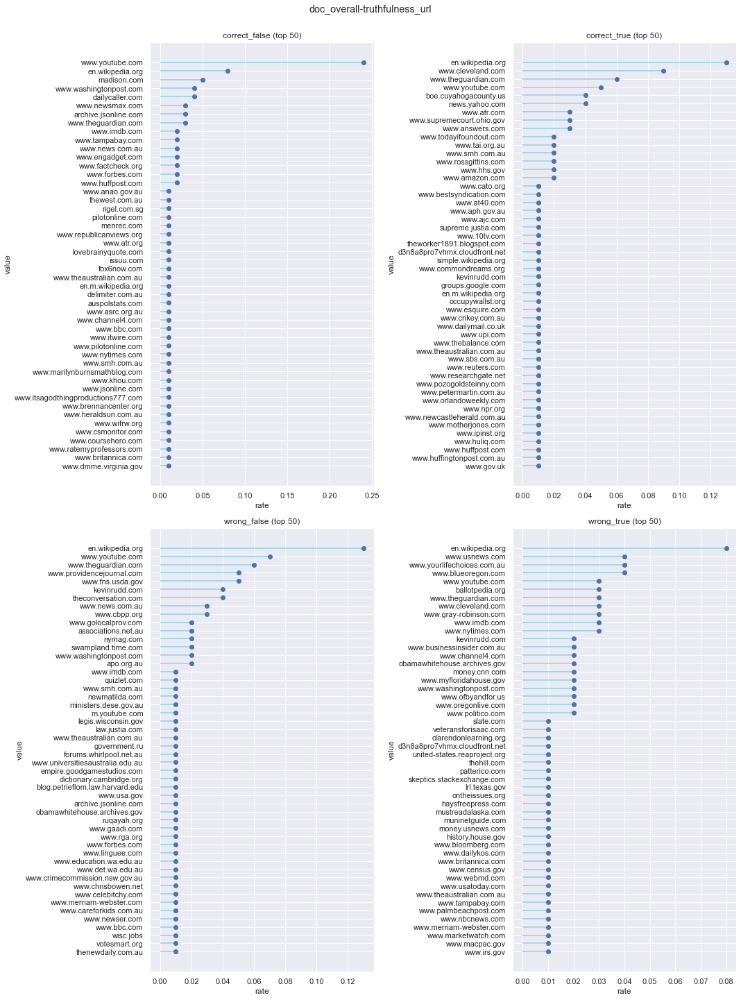

In [244]:
groupby=pd.read_csv(f"../Dati/groupby.csv")
groupby=groupby[groupby['file'].apply(lambda x: x.endswith('_all_10'))]
files=groupby.loc[:,'file'].unique()

amount=50
fig, axs = plt.subplots(2,2,figsize=(15,20))

for f, ax in zip(files,axs.flatten()): 
    urls=groupby[(groupby.type=='doc_overall-truthfulness_url') & (groupby.file == f)].sort_values('rate').tail(amount)
    ax.hlines(y=urls['value'], xmin=0, xmax=urls['rate'], color='skyblue')
    ax.plot(urls['rate'], urls['value'], "o")
    ax.set_title('_'.join(f.split('_')[:-2])+f" (top {amount})")
    ax.set_xlabel('rate')
    ax.set_ylabel('value')
    
fig.suptitle(t, y=1)
fig.tight_layout()
pathlib.Path(f"../Dati/urls_analysis").mkdir(parents=True, exist_ok=True) 
fig.savefig('../Dati/urls_analysis/urls_rate.png',  bbox_inches='tight')


In [12]:
rows=pd.read_csv(f"../Dati/all_rows.csv")
urls=pd.read_csv(f"../Dati/urls_analysis/url_correctness.csv")
rows['url_speaksabout']=np.nan
def assign_url_val(x):
    x['url_speaksabout']=urls.loc[(urls['type']==x['type']) & (urls['doc_statement']==x['doc_statement']) & (urls['doc_overall-truthfulness_url']==x['doc_overall-truthfulness_url']),'url_speaksabout'].head(1).values[0].astype('int8')
    return x
rows=rows.apply(assign_url_val, axis=1)
rows.to_csv('../Dati/all_rows.csv', index=False)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


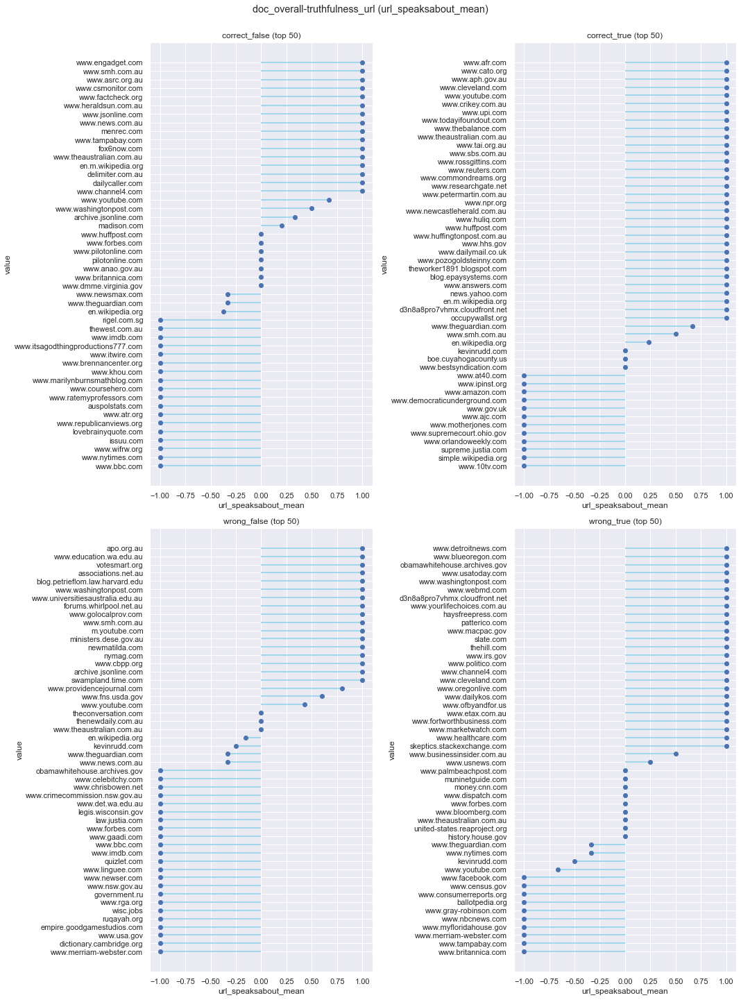

In [311]:
df_col=pd.DataFrame()

d=pd.read_csv(f"../Dati/all_rows.csv")
d=d[d['type'].apply(lambda x: x.endswith('_all_10'))]

col='doc_overall-truthfulness_url'
d[col]=d[col].map(lambda x: x.split("/")[2])
 
 
for f in d.type.unique():
    mean_speak=d[d['type']==f].groupby(col,as_index = False)['url_speaksabout'].agg({'url_speaksabout_mean':'mean'}).rename(columns={col:'value'}).sort_values(by='url_speaksabout_mean', ascending=False)
    mean_speak.insert(0, 'file', f)
    df_col=pd.concat([df_col, mean_speak])

amount=50
fig, axs = plt.subplots(2,2,figsize=(15,20))

for f, ax in zip(files,axs.flatten()): 
    urls=df_col[(df_col.file == f)].sort_values('url_speaksabout_mean').tail(amount)
    ax.hlines(y=urls['value'], xmin=0, xmax=urls['url_speaksabout_mean'], color='skyblue')
    ax.plot(urls['url_speaksabout_mean'], urls['value'], "o")
    ax.set_title('_'.join(f.split('_')[:-2])+f" (top {amount})")
    ax.set_xlabel('url_speaksabout_mean')
    ax.set_ylabel('value')
    
fig.suptitle(t+' (url_speaksabout_mean)', y=1)
fig.tight_layout()
pathlib.Path(f"../Dati/urls_analysis").mkdir(parents=True, exist_ok=True) 
fig.savefig('../Dati/urls_analysis/urls_rate_speaksabout.png',  bbox_inches='tight')

In [317]:
create_collage(2200, 1000, 3,1, ['../Dati/urls_analysis/urls_rate.png','../Dati/urls_analysis/urls_rate_ratio.png', '../Dati/urls_analysis/urls_rate_speaksabout.png'], '../Dati/pics/urls_collage.png')

0 0 0
1 735 0
2 1470 0


In [249]:
rows=pd.read_csv("../Dati/all_rows.csv")
rows['doc_name']=rows['doc_name'].map(lambda x: x.split('_')[0])
rows=rows.loc[rows['type'].map(lambda x: x.endswith('_all_10'))]

def get_fre_mean(x):
       return rows.loc[rows[x['col']]==x['value'], 'doc_statement'].apply(lambda x : flesch_reading_ease(x)).mean()

def get_fre_size(x):
       return len(rows.loc[rows[x['col']]==x['value'], 'doc_statement'].unique())

df=pd.DataFrame(columns=['col', 'value', 'url_speaksabout_mean', 'url_speaksabout_median', 'fre_mean'])
typs=columns.copy()
typs.remove('doc_overall-truthfulness_url')
for t in typs+['type', 'doc_statement']:
       url_group=rows.groupby(t,as_index = False)['url_speaksabout'].agg({'url_speaksabout_mean':'mean', 'url_speaksabout_median':'median', 'size_speak':'count'}).sort_values(by='url_speaksabout_mean')
       url_group=url_group.rename(columns={t:'value'})
       url_group.insert(loc=0, column='col', value=t)
       
       url_group['fre_mean']=url_group.apply(get_fre_mean, axis=1)
       url_group['size_fre']=url_group.apply(get_fre_size, axis=1)
       
       url_group[['url_speaksabout_mean', 'fre_mean']]=url_group[['url_speaksabout_mean', 'fre_mean']].round(decimals=2)
       
       df=pd.concat([df, url_group])
       
df['value']=df['value'].astype('string').apply(lambda x: x[:-2] if x.endswith('.0') else x)
df.to_csv('../Dati/urls_analysis/all_speakabout.csv', index=False)

In [251]:
speakabout=pd.read_csv("../Dati/urls_analysis/all_speakabout.csv")
speakabout=speakabout.loc[speakabout.col!='doc_statement']

cmap = plt.get_cmap('jet', 400)

for col in speakabout.col.unique():
    fig, axs = plt.subplots(2,2, figsize=(22,11))
    
    
    colors_speak=[ cmap(int(a)) for a in speakabout.loc[speakabout.col==col, 'size_speak'].values]
    colors_fre=[ cmap(int(a)*10) for a in speakabout.loc[speakabout.col==col, 'size_fre'].values]

    # cmap = plt.get_cmap('jet', N)
    # colors=sns.color_palette("husl", len(speakabout.loc[speakabout.col==col]))
    # colors_speak=[ (*c,a/(n_stat*40)) for c, a in zip(colors, speakabout.loc[speakabout.col==col, 'size_speak'].values)]
    # colors_fre=[ (*c,a/(n_stat*4)) for c, a in zip(colors, speakabout.loc[speakabout.col==col, 'size_fre'].values)]
    edge_c=(0,0,0)
    
    axs[0,0].bar(speakabout.loc[speakabout.col==col, 'value'], speakabout.loc[speakabout.col==col, 'url_speaksabout_median'], color=colors_speak, ec=edge_c, lw=3)
    axs[0,1].bar(speakabout.loc[speakabout.col==col, 'value'], speakabout.loc[speakabout.col==col, 'fre_mean'], color=colors_fre, ec=edge_c, lw=3)
    axs[1,0].bar(speakabout.loc[speakabout.col==col, 'value'], speakabout.loc[speakabout.col==col, 'url_speaksabout_mean'],color=colors_speak, ec=edge_c, lw=3)
    
    x=speakabout.loc[speakabout.col==col, 'fre_mean']
    y=speakabout.loc[speakabout.col==col, 'url_speaksabout_mean']
    z = np.polyfit(x, y, 1)
    y_hat = np.poly1d(z)(x)
   
    axs[1,1].scatter(x, y, s=[ a+20 for  a in speakabout.loc[speakabout.col==col, 'size_speak'].values], c=colors_fre, edgecolors=edge_c )
    text = f"$y={z[0]:0.3f}\;x{z[1]:+0.3f}$\n$R^2 = {r2_score(y,y_hat):0.3f}$"
    axs[1,1].plot(x, y_hat, c="gray", lw=1, label=text, linestyle='dashed')
    axs[1,1].legend(loc='lower right', fontsize=7)
    
    axs[0,0].set_ylabel("url_speaksabout_median")
    axs[0,1].set_ylabel("fre_mean")
    axs[1,0].set_ylabel("url_speaksabout_mean")
    
    axs[1,1].set_xlabel("fre_mean")
    axs[1,1].set_ylabel("url_speaksabout_mean")
    
    for i, txt in enumerate(speakabout.loc[speakabout.col==col, 'value'].values):
        axs[1,1].annotate(txt, (speakabout.loc[speakabout.col==col, 'fre_mean'].values[i], speakabout.loc[speakabout.col==col, 'url_speaksabout_mean'].values[i]))

    rot=10
    if(col=='doc_claimant'):
        rot=90
    for ax in axs.flatten():
        plt.setp(ax.get_xticklabels(), rotation=rot, horizontalalignment='right',  fontsize=15, color='black')
    
    # mean_inf_fre=speakabout.loc[(speakabout.col==col) & (speakabout.url_speaksabout_mean<0), 'fre_mean'].mean()
    # mean_sup_fre=speakabout.loc[(speakabout.col==col) & (speakabout.url_speaksabout_mean>0), 'fre_mean'].mean()
    # if not pd.isna(mean_inf_fre):
    #     mean_inf_fre=mean_inf_fre
    # if not pd.isna(mean_sup_fre):
    #     mean_sup_fre=mean_sup_fre
    # axs[0,1].axhline(mean_inf_fre, c='red',linestyle='dashed', label=f"mean fre for url_speaksabout_mean < 0 = {mean_inf_fre:.2f}")
    # axs[0,1].axhline(mean_sup_fre, c='black', linestyle='dotted', label=f"mean fre for url_speaksabout_mean > 0 = {mean_sup_fre:.2f}")
    # axs[0,1].legend(loc='lower right')
    # mean_speakabout=speakabout.loc[speakabout.col==col, 'url_speaksabout_mean'].mean()
    # axs[1,0].axhline(mean_speakabout, c='r', label=f"mean url_speaksabout_mean = {mean_speakabout:.2f}")
    # axs[1,0].legend(loc='lower right')

    
    fig.suptitle(col,y=1)
    fig.tight_layout()
    
    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    
    fig.colorbar(sm, ticks=np.linspace(0, 1, 10), label="considered samples % of total",ax=axs.ravel().tolist(), shrink=0.7)
    
    pathlib.Path(f"../Dati/urls_analysis/urls_plots").mkdir(parents=True, exist_ok=True) 
    fig.savefig(f"../Dati/urls_analysis/urls_plots/url_plot_{col}.png", bbox_inches='tight')


In [273]:
create_collage(10500, 2000, 9,3, [f"../Dati/urls_analysis/urls_plots/url_plot_{t}.png" for t in speakabout.col.unique()], '../Dati/pics/urls_analysis_collage.png')

0 0 0
1 0 668
2 0 1336
3 1168 0
4 1168 668
5 1168 1336
6 2336 0
7 2336 668
8 2336 1336
9 3504 0
10 3504 668
11 3504 1336
12 4672 0
13 4672 668
14 4672 1336
15 5840 0
16 5840 668
17 5840 1336
18 7008 0
19 7008 668
20 7008 1336
21 8176 0
22 8176 668
23 8176 1336
24 9344 0
25 9344 668
26 9344 1336


## ---------------------------

## Analisi NLP statements

In [20]:
statements=pd.read_csv('../Dati/all_rows.csv')
statements=statements.loc[statements['type'].map(lambda x: x.endswith('_all_10')), ['type', 'doc_statement']].drop_duplicates()
statements

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,type,doc_statement
51,correct_false_all_10,Says the Wisconsin Republican Party tweeted Ha...
61,correct_false_all_10,The Labor Party has repeatedly claimed the Coa...
62,correct_false_all_10,Says Barack Obama sold Chrysler to Italians wh...
81,correct_false_all_10,Were very prepared to put out a statement befo...
91,correct_false_all_10,We left the country with net assets of 70 bill...
101,correct_false_all_10,Anthony Albanese says eight out of the worlds ...
111,correct_false_all_10,Virginia papers called Scott Rigells campaign ...
121,correct_false_all_10,Tony Abbott says asylum seekers who come to Au...
122,correct_false_all_10,The National Science Foundation spent 12 milli...
141,correct_false_all_10,Scott Walkers income tax plan is a tax hike It...


E:\Python\Python39\lib\site-packages\pandas\plotting\_matplotlib\hist.py:412: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  axes = _grouped_hist(


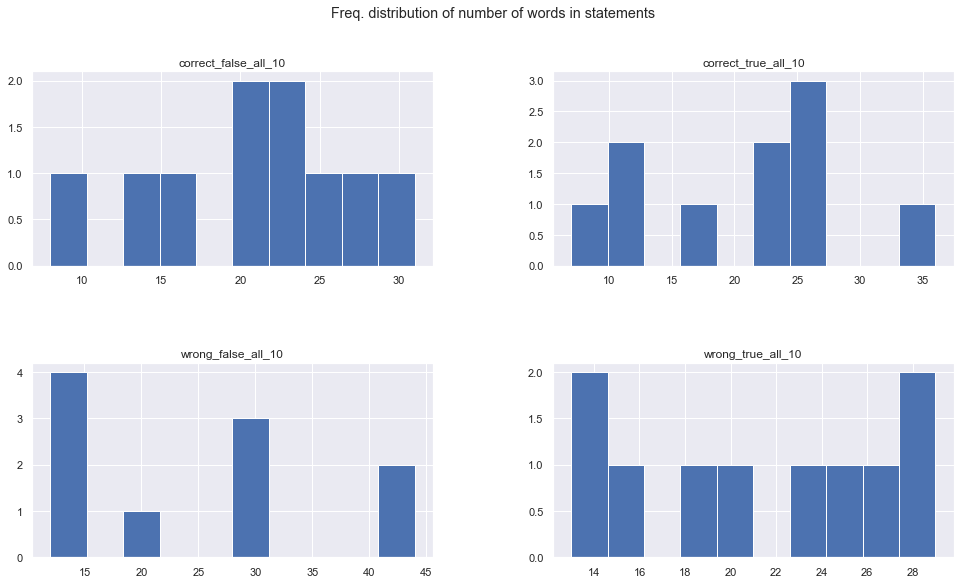

In [21]:
statements['len_s']=statements['doc_statement'].str.split().map(lambda x: len(x))
fig, ax = plt.subplots(figsize=(16,9))
statements.hist(column='len_s', by='type', ax=ax, rot=0)
fig.suptitle("Freq. distribution of number of words in statements",y=1)
pathlib.Path(f"../Dati/statem_nlp").mkdir(parents=True, exist_ok=True) 
fig.savefig("../Dati/statem_nlp/freq_nwords.png", bbox_inches='tight')

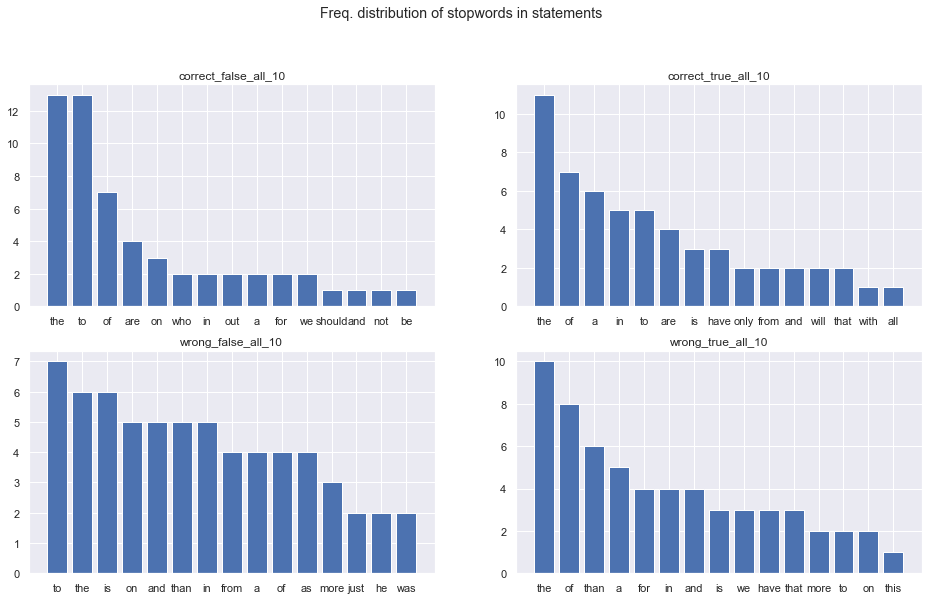

In [23]:
stop=set(stopwords.words('english'))
fig, axs = plt.subplots(2,2, figsize=(16,9))
for ax,f in zip(axs.flatten(),statements.type.unique()):
    corpus=[]
    statem= statements.loc[statements.type==f,'doc_statement'].str.split()
    statem=statem.values.tolist()
    corpus=[word for i in statem for word in i]
    corpus
    dic=defaultdict(int)
    for word in corpus:
        if word in stop:
            dic[word]+=1
            
    top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:15] 
    x,y=zip(*top)
    ax.bar(x,y)
    ax.set_title(f)
fig.suptitle("Freq. distribution of stopwords in statements",y=1)
fig.savefig("../Dati/statem_nlp/freq_stopwords.png", bbox_inches='tight')


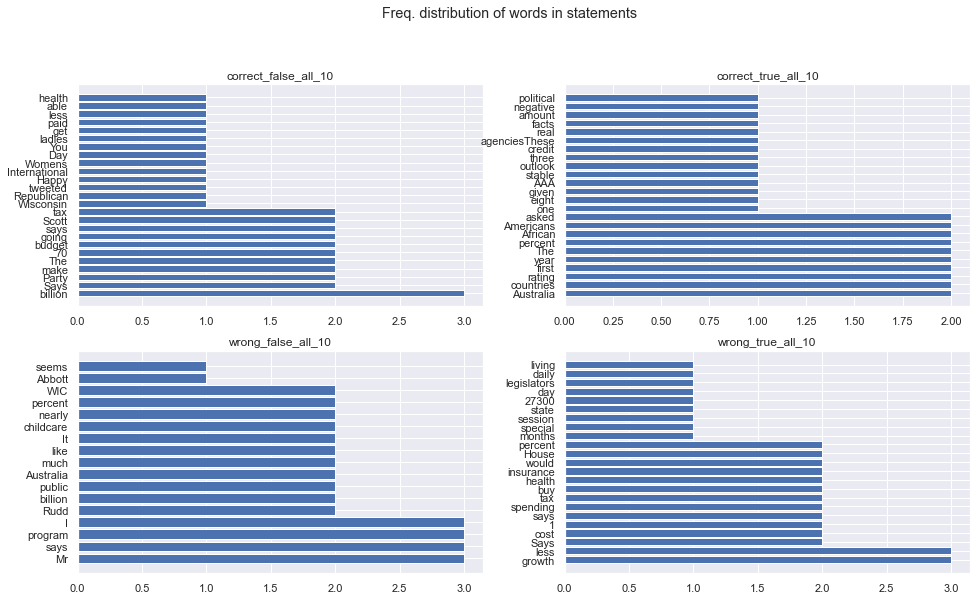

In [24]:
stop=set(stopwords.words('english'))
fig, axs = plt.subplots(2,2, figsize=(16,9))
for ax,f in zip(axs.flatten(),statements.type.unique()):
    
    statem= statements.loc[statements.type==f,'doc_statement'].str.split()
    statem=statem.values.tolist()
    corpus=[word for i in statem for word in i]

    counter=Counter(corpus)
    most=counter.most_common()
    x, y=[], []
    for word,count in most[:40]:
        if (word not in stop):
            x.append(word)
            y.append(count)
            
    ax.barh(x,y)
    ax.set_title(f)
    
fig.suptitle("Freq. distribution of words in statements",y=1)
fig.savefig("../Dati/statem_nlp/freq_words.png", bbox_inches='tight')

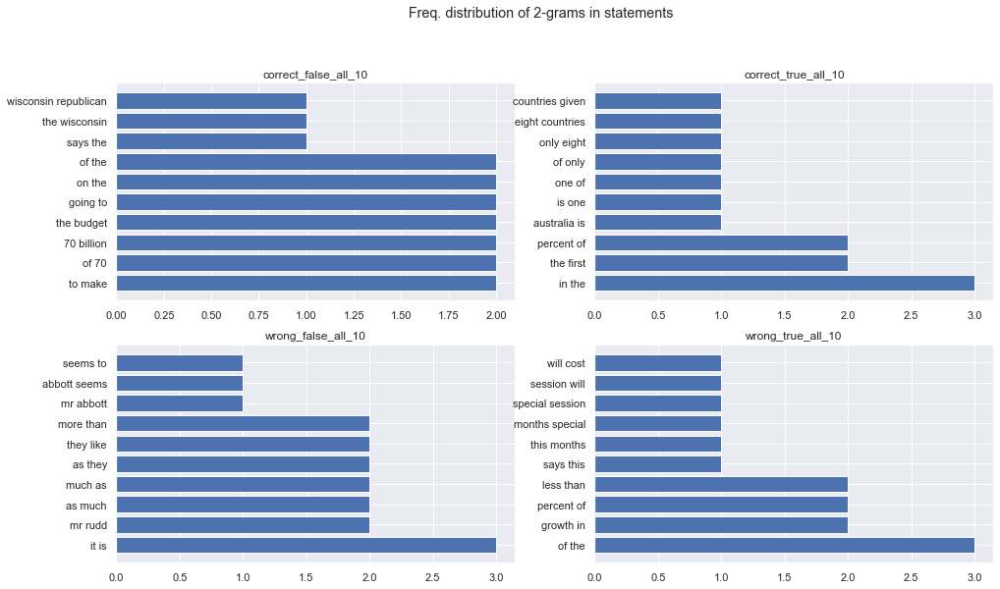

In [25]:
def _get_top_ngram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) 
                for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:10]

def plot_top_ngrams_barchart(statements, n=2):
    stop=set(stopwords.words('english'))
    fig, axs = plt.subplots(2,2, figsize=(16,9))
    for ax,f in zip(axs.flatten(),statements.type.unique()):
        statem= statements.loc[statements.type==f,'doc_statement'].str.split()
        statem=statem.values.tolist()
        corpus=[word for i in statem for word in i]

        top_n_bigrams=_get_top_ngram(statements.loc[statements.type==f,'doc_statement'],n)[:10]
        x,y=map(list,zip(*top_n_bigrams))
        ax.barh(x,y)
        ax.set_title(f)
        
    fig.suptitle("Freq. distribution of 2-grams in statements",y=1)
    fig.savefig(f"../Dati/statem_nlp/freq_{n}grams.png", bbox_inches='tight')
    
plot_top_ngrams_barchart(statements,2)

In [49]:
def get_lda_objects(text):
    stop=set(stopwords.words('english'))

    def _preprocess_text(text):
        corpus=[]
        stem=PorterStemmer()
        lem=WordNetLemmatizer()
        for stat in text:
            words=[w for w in word_tokenize(stat) if (w not in stop)]

            words=[lem.lemmatize(w) for w in words if len(w)>2]

            corpus.append(words)
        return corpus
    
    corpus=_preprocess_text(text)
    
    dic=gensim.corpora.Dictionary(corpus)
    bow_corpus = [dic.doc2bow(doc) for doc in corpus]
    
    lda_model =  gensim.models.LdaMulticore(bow_corpus, 
                                   num_topics = 4, 
                                   id2word = dic,                                    
                                   passes = 10,
                                   workers = 2)
    
    return lda_model, bow_corpus, dic

def plot_lda_vis(lda_model, bow_corpus, dic):
    pyLDAvis.enable_notebook()
    vis = gensimvis.prepare(lda_model, bow_corpus, dic)
    return vis

for f in statements.type.unique():
    lda_model, bow_corpus, dic = get_lda_objects(statements.loc[statements.type==f,'doc_statement'])
    lda_model.show_topics()
    vis=plot_lda_vis(lda_model, bow_corpus, dic)
    pyLDAvis.save_html(vis, f"../Dati/statem_nlp/lda_{f}.html")


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
E:\Python\Python39\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


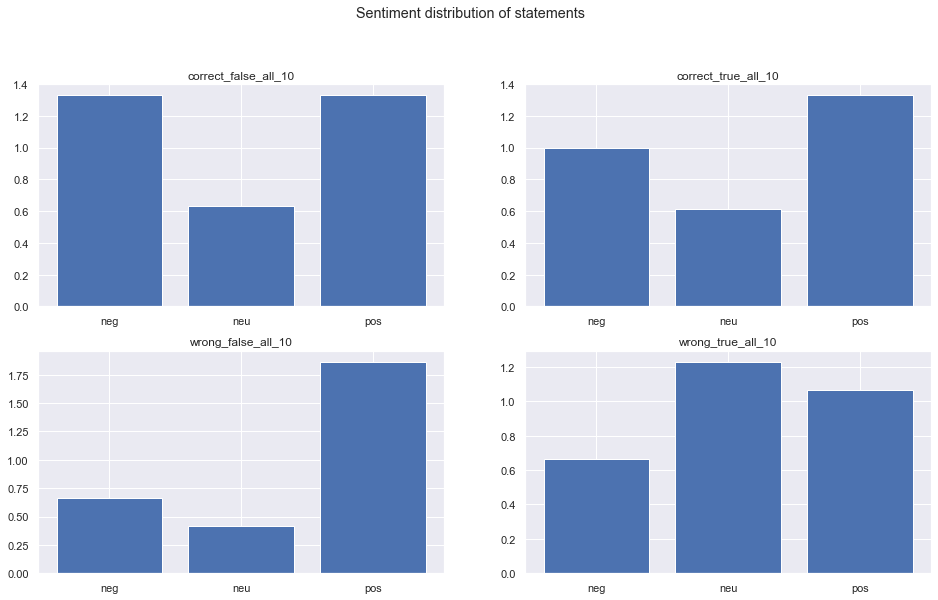

In [47]:
def sentiment_vader(text, sid):
    ss = sid.polarity_scores(text)
    ss.pop('compound')
    return max(ss, key=ss.get)

def sentiment_textblob(text):
        x = TextBlob(text).sentiment.polarity
        
        if x<0:
            return 'neg'
        elif x==0:
            return 'neu'
        else:
            return 'pos'

def plot_sentiment_barchart(text, method='TextBlob'):
    data=pd.read_csv('../Dati/multidimensional.csv')
    false_labs=['negative','pants-on-fire']
    true_labs=['positive','true']

    data=data.loc[data['doc_name']!='DEM_BARELYTRUE_doc7']


    data=data.loc[(data['doc_ground_truth_abc_label']==false_labs[0]) | 
            (data['doc_ground_truth_abc_label']==true_labs[0]) |
            (data['doc_ground_truth_politifact_label']==false_labs[1])|
            (data['doc_ground_truth_politifact_label']==true_labs[1])]

    data.loc[(data['doc_ground_truth_abc_label']==false_labs[0]) | (data['doc_ground_truth_politifact_label']==false_labs[1]),'type']='false'
    data.loc[(data['doc_ground_truth_abc_label']==true_labs[0]) | (data['doc_ground_truth_politifact_label']==true_labs[1]),'type']='true'
    data=data[['type', 'doc_statement']].drop_duplicates()
    
    fig, axs = plt.subplots(2,2, figsize=(16,9))
    for ax,f in zip(axs.flatten(),text.type.unique()):
        if method == 'TextBlob':
            sentiment = text.loc[text.type==f,'doc_statement'].map(lambda x: sentiment_textblob(x))
            all_sent= data.loc[data.type==f.split('_')[1],'doc_statement'].map(lambda x: sentiment_textblob(x))
        elif method == 'Vader':
            sid = SentimentIntensityAnalyzer()
            sentiment = text.loc[text.type==f,'doc_statement'].map(lambda x: sentiment_vader(x, sid=sid))
            all_sent= data.loc[data.type==f.split('_')[1],'doc_statement'].map(lambda x: sentiment_vader(x, sid=sid))
        else:
            raise ValueError('Textblob or Vader')
        

        sent=(sentiment.value_counts().sort_index()/10)/(all_sent.value_counts().sort_index().values/40)

        ax.bar(sent.index, sent)
        ax.set_title(f)

    fig.suptitle("Sentiment distribution of statements",y=1)
    fig.savefig(f"../Dati/statem_nlp/sentiments_{method}.png", bbox_inches='tight')

plot_sentiment_barchart(statements, method='TextBlob')
# plot_sentiment_barchart(statements, method='Vader')

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Mean Flesch Reading Ease correct_false_all_10: 60.617999999999995
Mean Flesch Reading Ease correct_true_all_10: 54.05499999999999
Mean Flesch Reading Ease wrong_false_all_10: 51.178000000000004
Mean Flesch Reading Ease wrong_true_all_10: 60.111000000000004


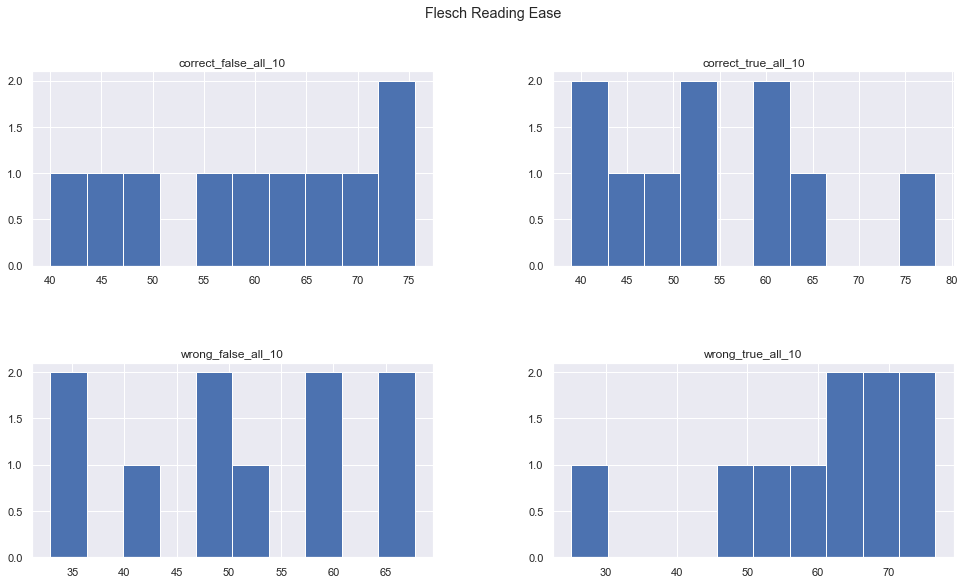

In [18]:
statements['fre']=statements['doc_statement'].apply(lambda x : flesch_reading_ease(x))
fig, ax = plt.subplots(figsize=(16,9))
statements.hist(column='fre', by='type', ax=ax, rot=0)

fig.suptitle("Flesch Reading Ease",y=1)
fig.savefig(f"../Dati/statem_nlp/read_complexity.png", bbox_inches='tight')

In [50]:
filenames = next(os.walk("../Dati/statem_nlp"), (None, None, []))[2]
filenames= [x for x in filenames if x.endswith('.png')]
create_collage(3000, 1200, 3,2, [f"../Dati/statem_nlp/{f}" for f in filenames], '../Dati/pics/nlp_collage.png'),

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0 0 0
1 0 602
2 1002 0
3 1002 602
4 2004 0
5 2004 602


(None,)

## ---------------------------

## Altre analisi

In [20]:
import plotly.express as px

df= pd.read_csv("../Dati/all_rows.csv")
df=df[df['type'].apply(lambda x: x.endswith('_all_10'))]

fig = px.parallel_categories(df, dimensions=['type', 'q_0_consideration_answer', 'q_0_political_views_answer'],
                color=(df.type.astype('category').cat.codes)/4, color_continuous_scale=px.colors.sequential.Inferno,
                labels={'type':'type', 'q_0_consideration_answer':'q_0_consideration_answer', 'q_0_political_views_answer':'q_0_political_views_answer'})
fig.show()

## ---------------------------

In [7]:
transf_cols={
    'q_0_age_answer':['19-25', '26-35', '36-50', '50-80'],
    'q_0_school_answer': ['High school graduate or GED (etc.)', 'Some college (etc.)', '4 year college/bachelor degree', 'Postgrad. or professional schooling, no degree', 'Postgrad. or professional degree (etc.)'],
    'q_0_taxes_answer': ['Less than 10,000','10,000 to less than 20,000','20,000 to less than 30,000','30,000 to less than 40,000','40,000 to less than 50,000','50,000 to less than 75,000','75,000 to less than 100,000','100,000 to less than 150,000','150,000 or more'],
    'q_0_political_views_answer':['Very conservative', 'Conservative', 'Moderate', 'Liberal', 'Very liberal'],
    'q_0_consideration_answer':['Republican','Democrat','Independent','Something else'],
    'q_0_southern_border_answer':['Disagree','No opinion either way','Agree'],
    'q_0_environment_answer':['Disagree','No opinion either way','Agree'],
    'q_1_farmers_value':['wrong value','correct value'],
    'q_2_marks_value':['wrong value','correct value'],
    'q_3_athletics_value':['wrong value','correct value'],
    'doc_name': ['REP','Liberal','DEM','Labor'],
    'doc_source': ['abc','politifact']
}

def transf_data_for_corr(rows):
    rows['doc_name']=rows['doc_name'].map(lambda x: x.split('_')[0])
    rows['fre']=rows['doc_statement'].apply(lambda x : flesch_reading_ease(x))
    for k,v in transf_cols.items():
        rows[k]=pd.Categorical(rows[k], categories = v, ordered = True).codes

def corr_matrix(df,method,typ):
    x=1 if typ=='all' else 2
    
    fig, axs = plt.subplots(x,2,figsize=(50, 30))

    for t,ax in zip(df.type.unique(), axs.flatten()):

        corr = df.loc[df.type==t].corr(method=method)

        mask = np.triu(np.ones_like(corr, dtype=bool))
        cmap = sns.diverging_palette(230, 20, as_cmap=True)
        sns.heatmap(corr, annot=True, mask = mask, cmap=cmap, ax=ax)
        ax.set_title(t)
        ax.set_xticklabels(
            ax.get_xticklabels(),
            rotation=30,
            horizontalalignment='right'
        )

    fig.suptitle(f"correlation heatmap {typ}, method={method}", y=1)
    fig.tight_layout()
    pathlib.Path(f"../Dati/corr_analysis").mkdir(parents=True, exist_ok=True) 
    fig.savefig(f'../Dati/corr_analysis/heatmap_{method}_{typ}.png',  bbox_inches='tight')


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


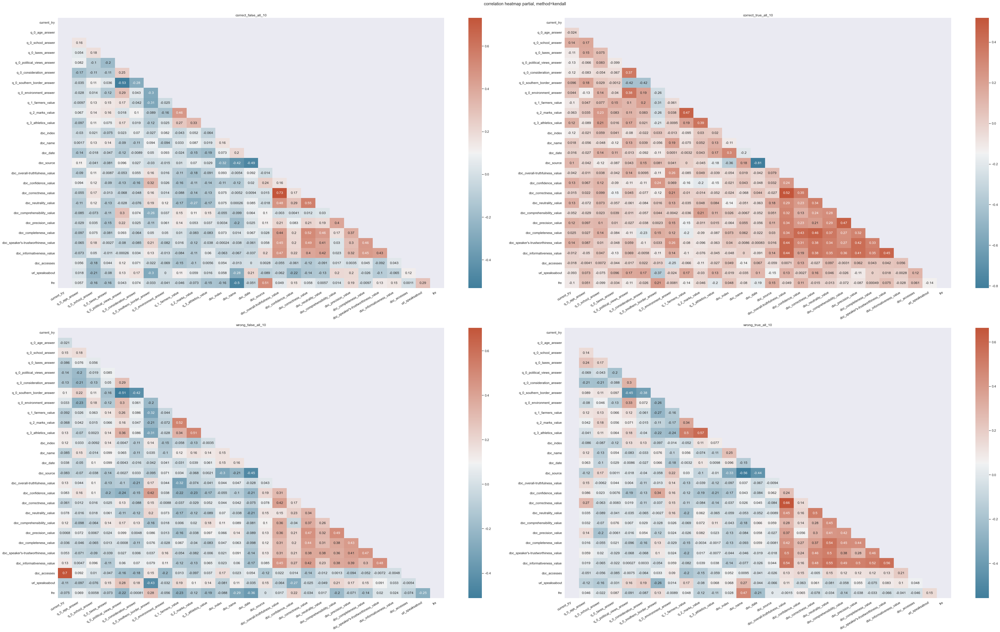

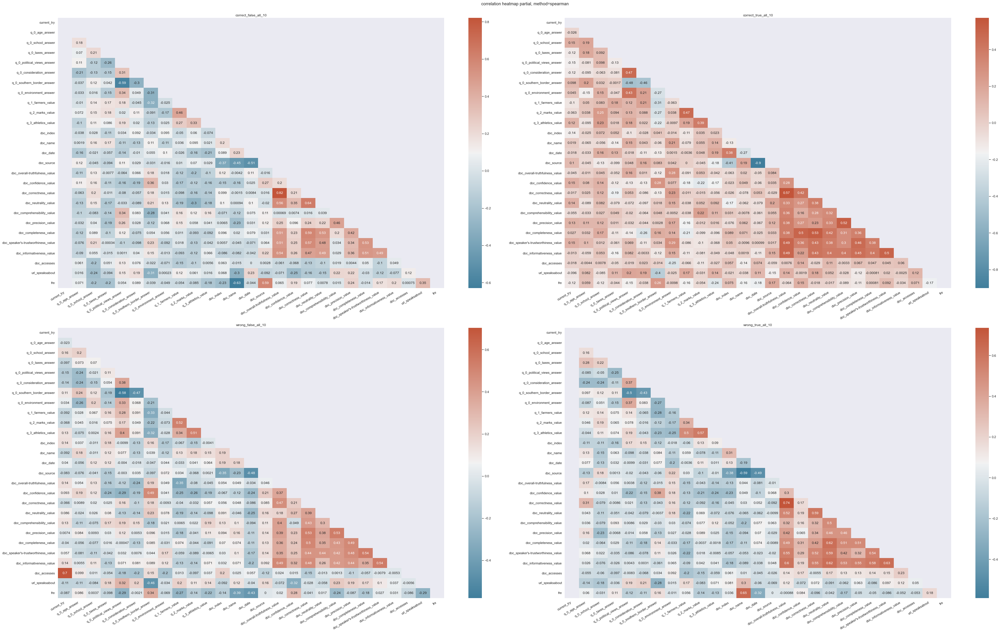

In [39]:
r= pd.read_csv("../Dati/all_rows.csv")
r=r[r['type'].apply(lambda x: x.endswith('_all_10'))]
transf_data_for_corr(r)
df=r[columns+['type','url_speaksabout','fre']].drop(['doc_claimant', 'doc_overall-truthfulness_url'], axis=1)

corr_matrix(df,'kendall', 'partial')
corr_matrix(df,'spearman', 'partial')

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


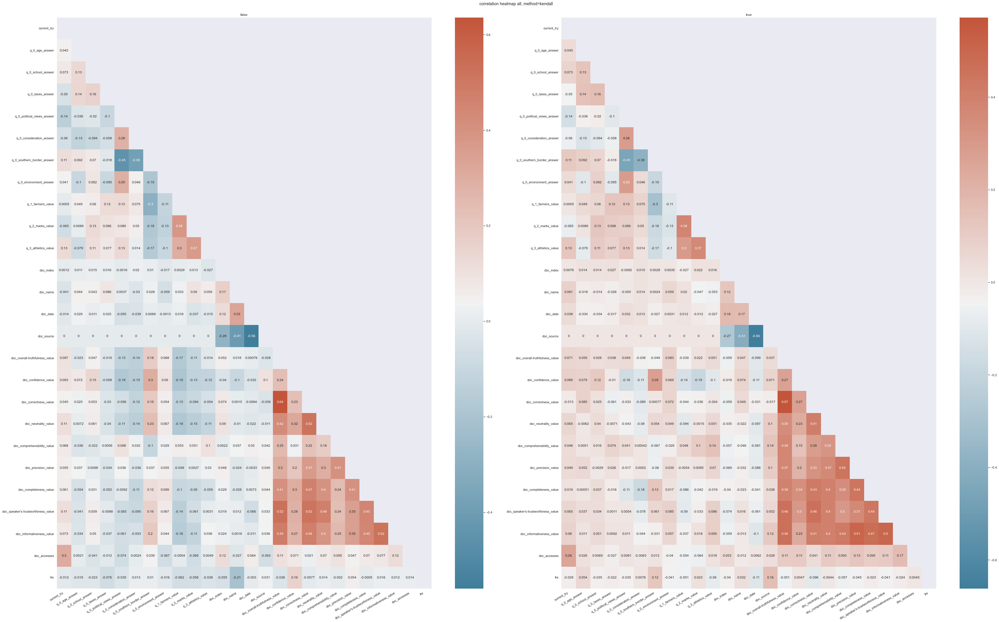

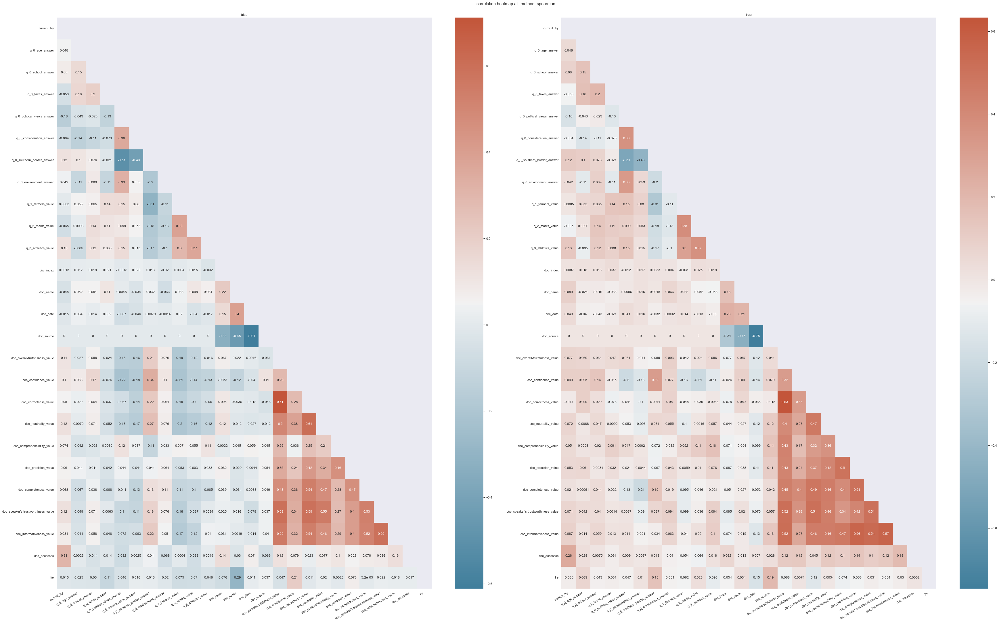

In [60]:
false_labs=['negative','pants-on-fire']
true_labs=['positive','true']

d = pd.read_csv("../Dati/multidimensional.csv")
d=d.loc[d['doc_name']!='DEM_BARELYTRUE_doc7']

d['q_1_farmers_value']=d['q_1_farmers_value'].map(lambda x: 'correct value' if x==3 else 'wrong value')
d['q_2_marks_value']=d['q_2_marks_value'].map(lambda x: 'correct value' if x==9 else 'wrong value')
d['q_3_athletics_value']=d['q_3_athletics_value'].map(lambda x: 'correct value' if x==4 else 'wrong value')
d['q_0_school_answer']=d['q_0_school_answer'].map(shorten_school)

d=d.loc[(d['doc_ground_truth_abc_label']==false_labs[0]) | 
        (d['doc_ground_truth_abc_label']==true_labs[0]) |
        (d['doc_ground_truth_politifact_label']==false_labs[1])|
        (d['doc_ground_truth_politifact_label']==true_labs[1])]

d.loc[(d['doc_ground_truth_abc_label']==false_labs[0]) | (d['doc_ground_truth_politifact_label']==false_labs[1]),'type']='false'
d.loc[(d['doc_ground_truth_abc_label']==true_labs[0]) | (d['doc_ground_truth_politifact_label']==true_labs[1]),'type']='true'

transf_data_for_corr(d)
data=d[columns+['type','fre']].drop(['doc_claimant', 'doc_overall-truthfulness_url'], axis=1)

corr_matrix(data,'kendall', 'all')
corr_matrix(data,'spearman', 'all')

In [63]:
create_collage(6500, 4000, 2,2, [f"../Dati/corr_analysis/{x}" for x in next(os.walk("../Dati/corr_analysis"), (None, None, []))[2]], '../Dati/pics/corr_collage.png')

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0 0 0
1 0 2002
2 3252 0
3 3252 2002


## ---------------------------

In [13]:
r= pd.read_csv("../Dati/all_rows.csv")
r=r[r['type'].apply(lambda x: x.endswith('_all_10'))]

d=r.copy()
transf_data_for_corr(d)
df=d[columns+['doc_statement','type','url_speaksabout','fre']].drop(['doc_claimant', 'doc_overall-truthfulness_url'], axis=1)


group = pd.read_csv("../Dati/groupby.csv")
group=group[group['file'].apply(lambda x: x.endswith('_all_10'))]
group=group.loc[group.type=='unit_id']

df_type_unit=d[columns+['unit_id','type','url_speaksabout','fre']].drop(['doc_claimant', 'doc_overall-truthfulness_url'], axis=1)
df_unit=d[columns+['unit_id','url_speaksabout','fre']].drop(['doc_claimant', 'doc_overall-truthfulness_url'], axis=1)

def set_type_unit(x):
    x.unit_id= group.loc[(group.file==x.type) & (group.value==x.unit_id),'rate'].values[0]
    return x

def set_unit(x):
    x.unit_id= group.loc[group.value==x.unit_id,'rate'].values[0]
    return x

df_type_unit=df_type_unit.apply(set_type_unit, axis=1)
df_unit=df_unit.apply(set_unit, axis=1)

df_type=df.groupby(['type'], as_index = False).mean().sort_values(by=['type','url_speaksabout'])
df_stat=df.groupby(['type', 'doc_statement'], as_index = False).mean().sort_values(by=['type','url_speaksabout'])
df_type_unit=df_type_unit.groupby(['type', 'unit_id'], as_index = False).mean().sort_values(by=['type','url_speaksabout'])
df_unit=df_unit.groupby(['unit_id'], as_index = False).mean().sort_values(by=['url_speaksabout'])

def transf_back(x):
    for k,v in transf_cols.items():
        x[k]=f"{v[round(float(x[k]))]} ({float(x[k]):.2f})"
    return x

df_type=df_type.apply(transf_back, axis=1)
df_stat=df_stat.apply(transf_back, axis=1)
df_type_unit=df_type_unit.apply(transf_back, axis=1)
df_unit=df_unit.apply(transf_back, axis=1)

df_type.to_csv('../Dati/groupby_type.csv', index=False)
df_stat.to_csv('../Dati/groupby_statement.csv', index=False)
df_type_unit.to_csv('../Dati/groupby_type_unit.csv', index=False)
df_unit.to_csv('../Dati/groupby_unit.csv', index=False)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

In [93]:
transf_cols_2={
    'q_0_age_answer':['19-25', '26-35', '36-50', '50-80'],
    'q_0_school_answer': ['High school graduate or GED (etc.)', 'Some college (etc.)', '4 year college/bachelor degree', 'Postgrad. or professional schooling, no degree', 'Postgrad. or professional degree (etc.)'],
    'q_0_taxes_answer': ['Less than 10,000','10,000 to less than 20,000','20,000 to less than 30,000','30,000 to less than 40,000','40,000 to less than 50,000','50,000 to less than 75,000','75,000 to less than 100,000','100,000 to less than 150,000','150,000 or more'],
    'q_0_political_views_answer':['Very conservative', 'Conservative', 'Moderate', 'Liberal', 'Very liberal'],
    'q_0_consideration_answer':['Republican','Democrat','Independent','Something else'],
    'q_0_southern_border_answer':['Disagree','No opinion either way','Agree'],
    'q_0_environment_answer':['Disagree','No opinion either way','Agree'],
    'q_1_farmers_value':['wrong value','correct value'],
    'q_2_marks_value':['wrong value','correct value'],
    'q_3_athletics_value':['wrong value','correct value']
}

def transf_data_2(rows):
    rows['doc_name']=rows['doc_name'].map(lambda x: x.split('_')[0])
    for k,v in transf_cols_2.items():
        rows[k]=pd.Categorical(rows[k], categories = v, ordered = True).codes
        
def transf_back_2(x):
    for k,v in transf_cols_2.items():
        x[k]=f"{v[round(float(x[k]))]} ({float(x[k]):.2f})"
    return x

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

In [136]:
multi = pd.read_csv("../Dati/multidimensional.csv")
multi=multi.loc[multi['doc_name']!='DEM_BARELYTRUE_doc7']
multi['q_1_farmers_value']=multi['q_1_farmers_value'].map(lambda x: 'correct value' if x==3 else 'wrong value')
multi['q_2_marks_value']=multi['q_2_marks_value'].map(lambda x: 'correct value' if x==9 else 'wrong value')
multi['q_3_athletics_value']=multi['q_3_athletics_value'].map(lambda x: 'correct value' if x==4 else 'wrong value')
multi['q_0_school_answer']=multi['q_0_school_answer'].map(shorten_school)

group = pd.read_csv("../Dati/groupby.csv")
group=group[group['file'].apply(lambda x: x.endswith('_all_10'))]

def set_type_unit(x):
        x.unit_id= group.loc[(group.file==f) & (group.value==x.unit_id),'rate'].values[0]
        return x

df_type=None
df_type_unit=None
df_ng=None
df_ng_type=None
for f in group.file.unique():
    g=group.loc[(group.file==f) & (group.type=='unit_id')]
    m_g=multi.loc[(multi['unit_id'].isin(g.value.values)) & (multi.doc_source=='gold_question')]
    d_g=m_g.copy()
    
    m_ng=multi.loc[(multi['unit_id'].isin(g.value.values)) & (multi.doc_source!='gold_question')]
    d_ng=m_ng.copy()
    
    transf_data_2(d_g)
    transf_data_2(d_ng)
    
    data_type=d_g[columns].drop(['doc_claimant', 'doc_overall-truthfulness_url','doc_source'], axis=1)
    data_type_unit=d_g[columns+['unit_id']].drop(['doc_claimant', 'doc_overall-truthfulness_url','doc_source'], axis=1)
    data_ng=d_ng[columns].drop(['doc_claimant', 'doc_overall-truthfulness_url','doc_source','doc_name'], axis=1)
    data_ng_type=d_ng[columns+['unit_id']].drop(['doc_claimant', 'doc_overall-truthfulness_url','doc_source','doc_name'], axis=1)
    
    data_type_unit=data_type_unit.apply(set_type_unit, axis=1)
    data_ng_type=data_ng_type.apply(set_type_unit, axis=1)
    
    data_type=data_type.groupby(['doc_name'], as_index = False).mean().sort_values(by=['doc_name'])
    data_type_unit=data_type_unit.groupby(['unit_id','doc_name'], as_index = False).mean().sort_values(by=['doc_name'])
    
    data_type=data_type.apply(transf_back_2, axis=1)
    data_type_unit=data_type_unit.apply(transf_back_2, axis=1)
    
    data_type.insert(0, 'type', f)
    data_type_unit.insert(0, 'type', f)
    data_ng.insert(0, 'type', f)
    data_ng_type.insert(0, 'type', f)
    
    
    if df_type is None:
        df_type=data_type.copy()
        df_type_unit=data_type_unit.copy()
        df_ng=data_ng.copy()
        df_ng_type=data_ng_type.copy()
    else:
        df_type=pd.concat([df_type,data_type])
        df_type_unit=pd.concat([df_type_unit,data_type_unit])
        df_ng=pd.concat([df_ng,data_ng])
        df_ng_type=pd.concat([df_ng_type,data_ng_type])
        
df_ng=df_ng.groupby(['type'], as_index = False).mean().sort_values(by=['type'])
df_ng_type=df_ng_type.groupby(['type','unit_id'], as_index = False).mean().sort_values(by=['type'])

df_ng=df_ng.apply(transf_back_2, axis=1)
df_ng_type=df_ng_type.apply(transf_back_2, axis=1)

df_ng.to_csv('../Dati/not_gold_type.csv', index=False)
df_ng_type.to_csv('../Dati/not_gold_type_unit.csv', index=False)
df_type.to_csv('../Dati/gold_type.csv', index=False)
df_type_unit.to_csv('../Dati/gold_type_unit.csv', index=False)

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ---------------------------

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
<ipython-input-39-837529f2cdfd>:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1,2,figsize=(16, 5))


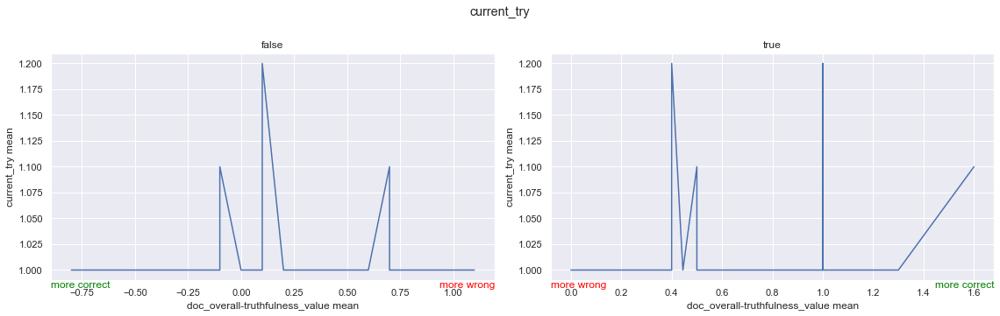

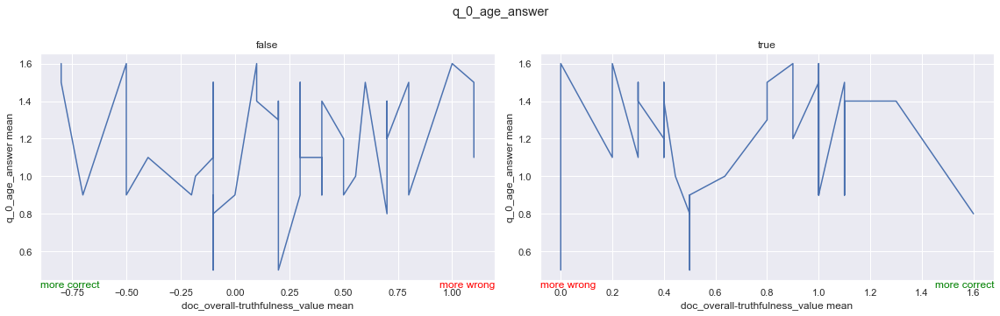

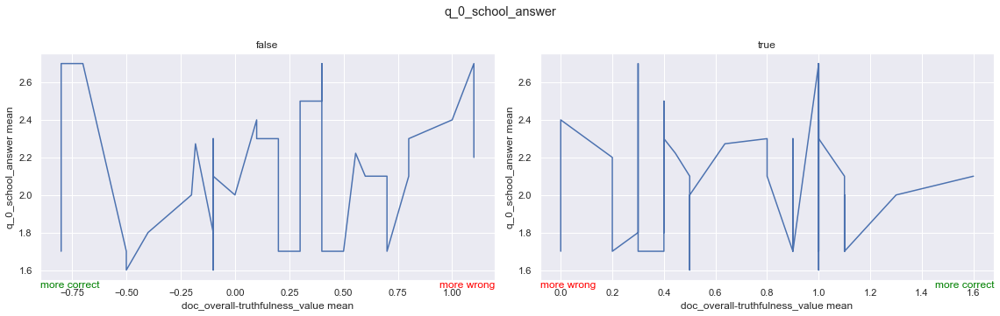

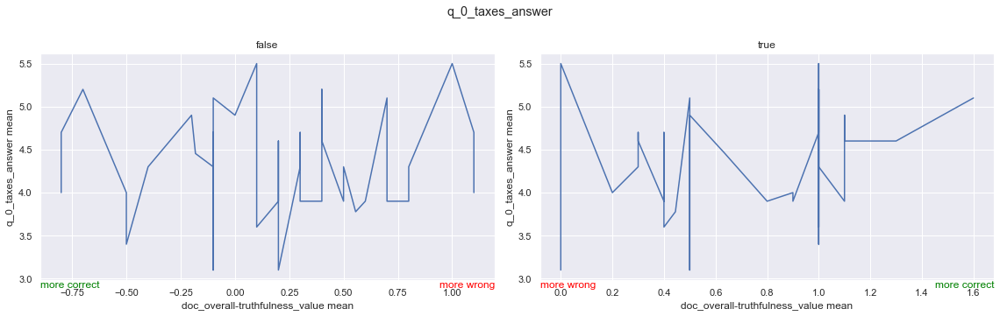

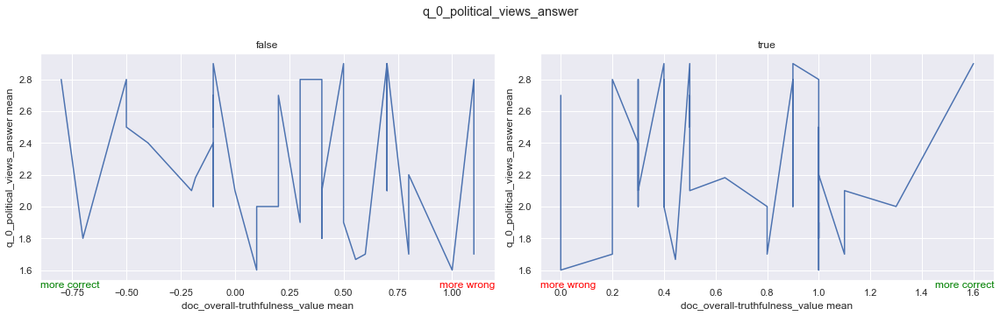

...

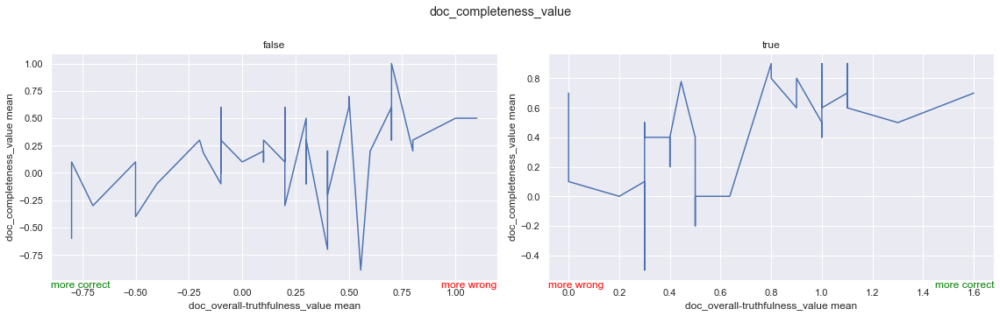

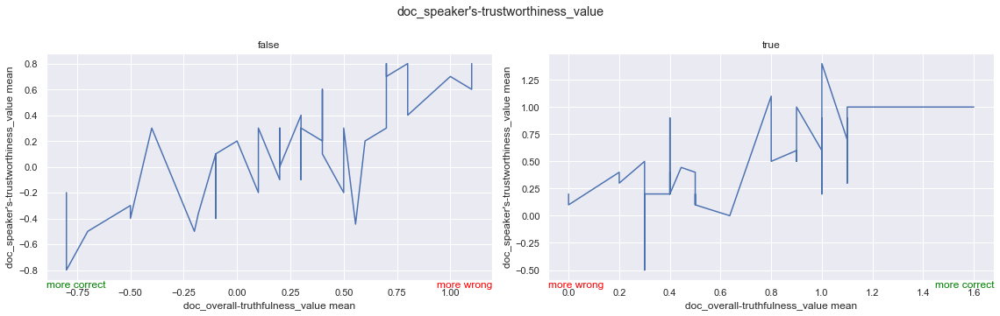

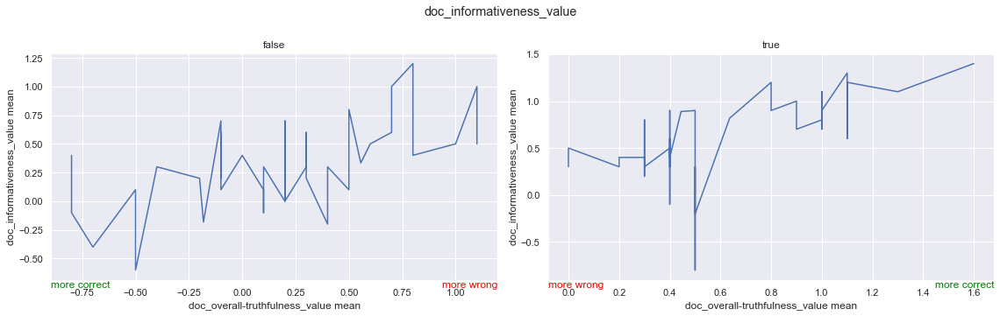

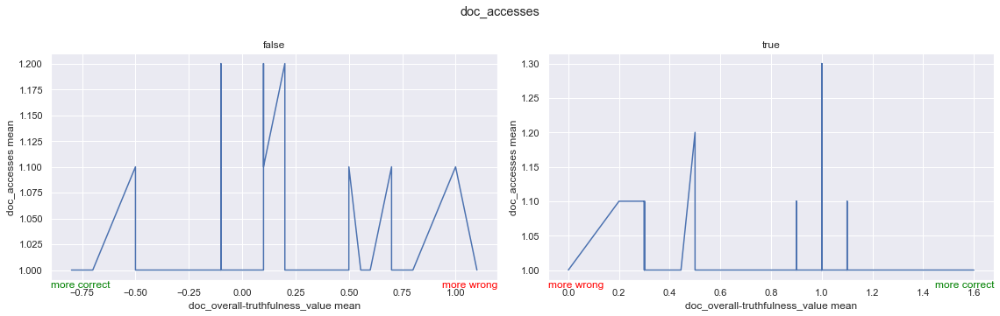

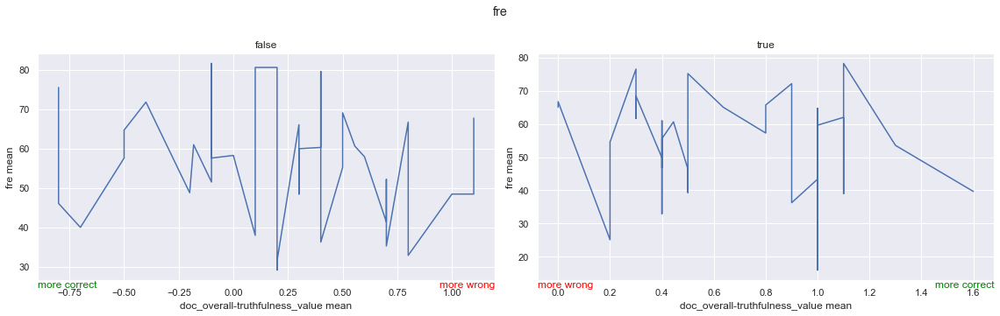

In [39]:
false_labs=['negative','pants-on-fire']
true_labs=['positive','true']

d = pd.read_csv("../Dati/multidimensional.csv")
d=d.loc[d['doc_name']!='DEM_BARELYTRUE_doc7']

d['q_1_farmers_value']=d['q_1_farmers_value'].map(lambda x: 'correct value' if x==3 else 'wrong value')
d['q_2_marks_value']=d['q_2_marks_value'].map(lambda x: 'correct value' if x==9 else 'wrong value')
d['q_3_athletics_value']=d['q_3_athletics_value'].map(lambda x: 'correct value' if x==4 else 'wrong value')
d['q_0_school_answer']=d['q_0_school_answer'].map(shorten_school)

d=d.loc[(d['doc_ground_truth_abc_label']==false_labs[0]) | 
        (d['doc_ground_truth_abc_label']==true_labs[0]) |
        (d['doc_ground_truth_politifact_label']==false_labs[1])|
        (d['doc_ground_truth_politifact_label']==true_labs[1])]

d.loc[(d['doc_ground_truth_abc_label']==false_labs[0]) | (d['doc_ground_truth_politifact_label']==false_labs[1]),'type']='false'
d.loc[(d['doc_ground_truth_abc_label']==true_labs[0]) | (d['doc_ground_truth_politifact_label']==true_labs[1]),'type']='true'

transf_data_for_corr(d)
data=d[columns+['doc_statement','type','fre']].drop(['doc_claimant', 'doc_overall-truthfulness_url'], axis=1)

data=data.groupby(['type', 'doc_statement'], as_index = False).mean().sort_values(by=['type','doc_overall-truthfulness_value'])

# data=data.apply(transf_back, axis=1)

cols=data.columns.values
cols = cols[ ~np.isin(cols, ['type','doc_statement']) ]
left, width = 0, 1
bottom, height = 0, 1
right = left + width
top = bottom + height
for c in cols:
        fig, axs = plt.subplots(1,2,figsize=(16, 5))

        for t,ax in zip(data.type.unique(), axs.flatten()):
                ax.plot(data.loc[data.type==t,'doc_overall-truthfulness_value'], data.loc[data.type==t,c])
                ax.set_title(t)
                ax.set_xlabel('doc_overall-truthfulness_value mean')
                ax.set_ylabel(f'{c} mean')
                if t == 'false':
                        sx='more correct'
                        dx='more wrong'
                        color_sx='green'
                        color_dx='red'
                else:
                        sx='more wrong'
                        dx='more correct'
                        color_sx='red'
                        color_dx='green'
                        
                ax.text(left, bottom, sx,
                        horizontalalignment='left',
                        verticalalignment='top',
                        color=color_sx,
                        transform=ax.transAxes)
                ax.text(right, bottom, dx,
                        horizontalalignment='right',
                        verticalalignment='top',
                        color=color_dx,
                        transform=ax.transAxes)

        fig.suptitle(f"{c}", y=1)
        fig.tight_layout()
        pathlib.Path(f"../Dati/trend_plots").mkdir(parents=True, exist_ok=True) 
        fig.savefig(f'../Dati/trend_plots/trend_{c}.png',  bbox_inches='tight')

In [40]:
create_collage(10000, 500, 13,2, [f"../Dati/trend_plots/trend_{c}.png" for c in  cols], '../Dati/pics/trends_collage.png')

E:\Python\Python39\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0 0 0
1 0 252
2 771 0
3 771 252
4 1542 0
5 1542 252
6 2313 0
7 2313 252
8 3084 0
9 3084 252
10 3855 0
11 3855 252
12 4626 0
13 4626 252
14 5397 0
15 5397 252
16 6168 0
17 6168 252
18 6939 0
19 6939 252
20 7710 0
21 7710 252
22 8481 0
23 8481 252
24 9252 0
25 9252 252
